# <font color="#114b98">Projet 7 : Développez une preuve de concept</font>

Ce projet vise à explorer et implémenter une nouvelle méthode pour améliorer un algorithme de machine learning actuellement en production. 

Le jeu de données utilisé dans ce projet s'appelle **CWD30**. Il comprend plus de 219 770 images haute résolution de 20 espèces de mauvaises herbes et 10 espèces de cultures. Le jeu de données couvre différents stades de croissance, plusieurs angles de vue et des conditions environnementales diverses. Ces images ont été collectées dans des champs agricoles variés, provenant de différentes régions géographiques et de différentes saisons, ce qui garantit un jeu de données représentatif.

CWD30 offre une ressource précieuse pour des tâches telles que la reconnaissance des espèces de mauvaises herbes, la discrimination des cultures et des mauvaises herbes, et la phénotypisation des plantes dans des contextes agricoles. Sa taille importante et sa diversité en font un jeu de données adapté à l'entraînement de modèles d'apprentissage automatique robustes capables de relever les défis réels liés à la gestion des mauvaises herbes et à la production agricole.

Nous nous concentrons spécifiquement sur l'étude des espèces de plantes suivantes : maïs (corn), arachide (peanut), périlla (perilla), millet proso (proso-millet) et sésame (sesame). Ces espèces de plantes ont été sélectionnées en raison de leur importance agricole et de leur représentativité variée dans le jeu de données CWD30. De plus, ces plantes présentent une diversité de caractéristiques, de formes et de stades de croissance, permettant ainsi d'explorer et de relever différents défis de la classification et de l'analyse de croissance des plantes dans des contextes agricoles réels.

Tout d'abord, nous utiliserons le modèle **MobileNetV3**, qui a été entraîné sur l'ensemble de données **ImageNet** et qui présente l'avantage d'être plus léger et plus rapide que certains modèles très performants comme InceptionV3, pour extraire les caractéristiques des images, et avoir une référence (ou "baseline") pour évaluer les performances de nos modèles ultérieurs.

Nous implémentons volontairement un problème de déséquilibre des espèces de plantes qui s'ajoute au déséquilibre déjà présent dans les données de croissance. Pour résoudre ces problèmes, nous allons adopter deux approches différentes.

Dans un premier temps, nous allons tester des méthodes usuelles, telles que la pondération des classes ou l'utilisation de techniques de sous-échantillonnage, pour équilibrer les classes. Ces méthodes sont couramment utilisées dans les cas de déséquilibre de classes pour améliorer les performances des modèles.

Dans un second temps, nous allons implémenter des méthodes State-of-the-Art (SOTA) pour résoudre spécifiquement le problème de déséquilibre des classes. Pour la croissance, nous utiliserons la méthode **DenseWeight** (Steininger, M., Kobs, K., Davidson, P. et al. Density-based weighting for imbalanced regression. Mach Learn 110, 2187–2211 (2021). https://doi.org/10.1007/s10994-021-06023-5) qui pondère les erreurs de manière à accorder plus d'importance aux groupes sous-représentés. Pour les classes, nous utiliserons la fonction de perte **LMFLoss** (Abu Adnan Sadi, Labib Chowdhury, Nursrat Jahan, Mohammad Newaz Sharif Rafi, Radeya Chowdhury, Faisal Ahamed Khan, Nabeel Mohammed. LMFLOSS: A Hybrid Loss For Imbalanced Medical Image Classification. arXiv preprint arXiv:2212.12741 (2022). https://arxiv.org/pdf/2212.12741.pdf), qui vise à réduire le déséquilibre de la distribution de la classe majoritaire tout en dirigeant l'attention du modèle vers les classes minoritaires.

Nous allons ensuite construire notre propre modèle pour prédire **l'espèce de la plante et son état de croissance simultanément**. Nous allons entraîner et évaluer ce modèle, en utilisant des métriques appropriées pour chaque tâche. Nous comparerons également les performances de notre modèle à celles du modèle MobileNet, afin de déterminer s'il est capable d'améliorer les performances de la référence.

## <font color="#114b98">Sommaire</font>
[1. Chargement du jeu de données](#section_1)

[2. Exploration du jeu de données](#section_2)

[3. Préparation des données](#section_3)

[4. Modèle MobileNetV3Small - Baseline](#section_4)

[5. Pondération des échantillons lors de l'entraînement](#section_5)

[6. Sous-échantillonage des classes majoritaires](#section_6)

[7. Implémentation de DenseWeight & LMFLoss](#section_7)

[8. Comparaison des performances](#section_8)

## <font color="#114b98" id="section_1">1. Chargement du jeu de données</font>

In [1]:
import os
import cv2
import sys
import pickle
import sklearn
import warnings
import visualkeras
import numpy as np
import pandas as pd
import seaborn as sns
import multiprocessing
import tensorflow as tf
import keras.backend as K
from tensorflow import keras
import matplotlib.pyplot as plt
from PIL import Image, ImageFont
from keras.optimizers import Adam
from keras_tuner import Objective
import matplotlib.ticker as ticker
from collections import defaultdict
import matplotlib.colors as mcolors
from denseweight import DenseWeight
from keras.callbacks import EarlyStopping
from sklearn.preprocessing import LabelEncoder
from keras.models import Sequential, load_model
from keras.applications import MobileNetV3Small
from keras import Model, mixed_precision, losses
from keras_tuner.tuners import BayesianOptimization
from sklearn.model_selection import train_test_split
from imblearn.under_sampling import RandomUnderSampler
from keras.preprocessing.image import ImageDataGenerator
from keras.layers import Input, Dense, Dropout, GlobalAveragePooling2D, Rescaling
from keras.layers import BatchNormalization, MaxPooling2D, Flatten, ZeroPadding2D, Conv2D
from sklearn.metrics import classification_report, confusion_matrix, f1_score, mean_absolute_error

In [2]:
print("System Version: ", sys.version)
print("Scikit-learn Version: ", sklearn.__version__)
print("Tensorflow Version: ", tf.__version__)
print("Keras Version: ", tf.keras.__version__)
print("Num CPUs Available: ", multiprocessing.cpu_count())
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
print("Tensorflow build with CUDA:", tf.test.is_built_with_cuda())

# Increase GPU capacity
os.environ['TF_FORCE_GPU_ALLOW_GROWTH'] = 'true'
policy = mixed_precision.Policy("mixed_float16")
mixed_precision.set_global_policy(policy)

System Version:  3.9.13 (main, Aug 25 2022, 23:51:50) [MSC v.1916 64 bit (AMD64)]
Scikit-learn Version:  1.2.2
Tensorflow Version:  2.10.1
Keras Version:  2.10.0
Num CPUs Available:  16
Num GPUs Available:  1
Tensorflow build with CUDA: True
INFO:tensorflow:Mixed precision compatibility check (mixed_float16): OK
Your GPU will likely run quickly with dtype policy mixed_float16 as it has compute capability of at least 7.0. Your GPU: NVIDIA GeForce RTX 3060, compute capability 8.6


In [3]:
warnings.filterwarnings('ignore')
plt.style.use('seaborn')
sns.set_style('whitegrid')
tf.autograph.set_verbosity(0)
tf.config.run_functions_eagerly(True)
tf.get_logger().setLevel('ERROR')
font = ImageFont.truetype("arial.ttf", 20) 
df_palette = sns.hls_palette()
palette = sns.color_palette("Set2", n_colors=11)
colors = [mcolors.to_hex(mcolors.to_rgba(color)) for color in palette]
color_map = defaultdict(dict)
color_map[ZeroPadding2D]['fill'] = colors[0]
color_map[Rescaling]['fill'] = colors[1]
color_map[MaxPooling2D]['fill'] = colors[3]
color_map[Conv2D]['fill'] = colors[4]
color_map[Dense]['fill'] = colors[6]
color_map[Flatten]['fill'] = colors[5]
color_map[BatchNormalization]['fill'] = colors[7]
color_map[GlobalAveragePooling2D]['fill'] = colors[8]
color_map[Sequential]['fill'] = colors[9]
color_map[Dropout]['fill'] = colors[10]
# %load_ext pycodestyle_magic
# %pycodestyle_on

In [93]:
# Répertoire de travail
path = 'N:/5 - WORK/1 - Projets/Projet 7/ressources/CWD30/'
dataset_dir = path + 'data/'

# Définition des dictionnaires de résultats
dict_label_f1_score = dict()
dict_growth_mae = dict()

# Definition de la taille des batchs et des images
batch_size = 32
image_size = (224, 224)
input_shape = (224, 224, 3)

In [5]:
file_paths = []
sub_dir_names = []
growth_values = []
angle_values = []

for sub_dir in os.listdir(dataset_dir):
    sub_dir_path = os.path.join(dataset_dir, sub_dir)
    if os.path.isdir(sub_dir_path):      
        for file_name in os.listdir(sub_dir_path):
            if file_name.endswith(".JPG"):
                file_path = os.path.join(sub_dir_path, file_name)
                file_path = os.path.join(sub_dir_path, file_name)
                file_name_without_ext = os.path.splitext(os.path.basename(file_name))[0]
                
                # Extraction des informations du nom de fichier
                parts = file_name_without_ext.split('_')
                angle = int(parts[3])
                growth = int(parts[2][1:])

                # Ajout des valeurs aux listes correspondantes
                growth_values.append(growth)
                angle_values.append(angle)
                sub_dir_names.append(sub_dir)
                file_paths.append(file_path)

# Création du DataFrame
data = pd.DataFrame({
    "file_path": file_paths,
    "label": sub_dir_names,
    "growth": growth_values,
    "angle": angle_values
})

data.sample(5)

,file_path,label,growth,angle
10567,N:/5 - WORK/1 - Projets/Projet 7/ressources/CW...,perilla,8,90
3519,N:/5 - WORK/1 - Projets/Projet 7/ressources/CW...,peanut,1,90
8603,N:/5 - WORK/1 - Projets/Projet 7/ressources/CW...,perilla,4,45
12398,N:/5 - WORK/1 - Projets/Projet 7/ressources/CW...,proso-millet,5,45
11220,N:/5 - WORK/1 - Projets/Projet 7/ressources/CW...,proso-millet,3,90


## <font color="#114b98" id="section_2">2. Exploration du jeu de données</font>

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16976 entries, 0 to 16975
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   file_path  16976 non-null  object
 1   label      16976 non-null  object
 2   growth     16976 non-null  int64 
 3   angle      16976 non-null  int64 
dtypes: int64(2), object(2)
memory usage: 530.6+ KB


In [7]:
plant_labels = data['label'].unique()
print(plant_labels)

['corn' 'peanut' 'perilla' 'proso-millet' 'sesame']


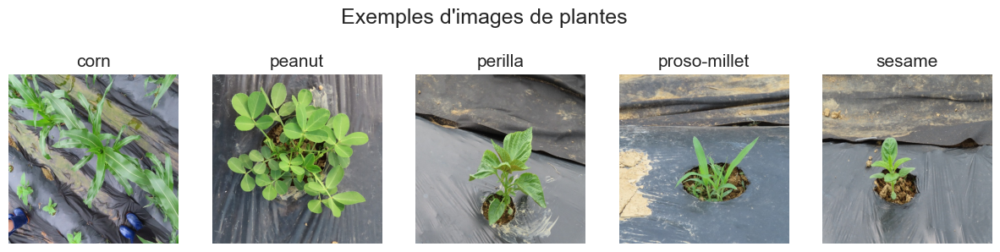

In [8]:
# Création d'une figure et d'un subplot 1 x 5
fig, axes = plt.subplots(1, 5, figsize=(15, 4))

# Boucle sur les types de label
for i, label in enumerate(data['label'].unique()):
    # Sélection des données pour le label actuel
    subset = data[data['label'] == label].sample(1)
    
    # Chemin d'accès à l'image
    image_path = subset['file_path'].values[0]
    
    # Affichage de l'image sur le subplot correspondant
    ax = axes[i]
    ax.axis('off')
    ax.set_title(label, fontsize=15)
    image = plt.imread(image_path)
    ax.imshow(image)

# Ajout du titre
plt.suptitle("Exemples d'images de plantes", fontsize=18, y=0.94)

# Affichage du graphe
plt.show()

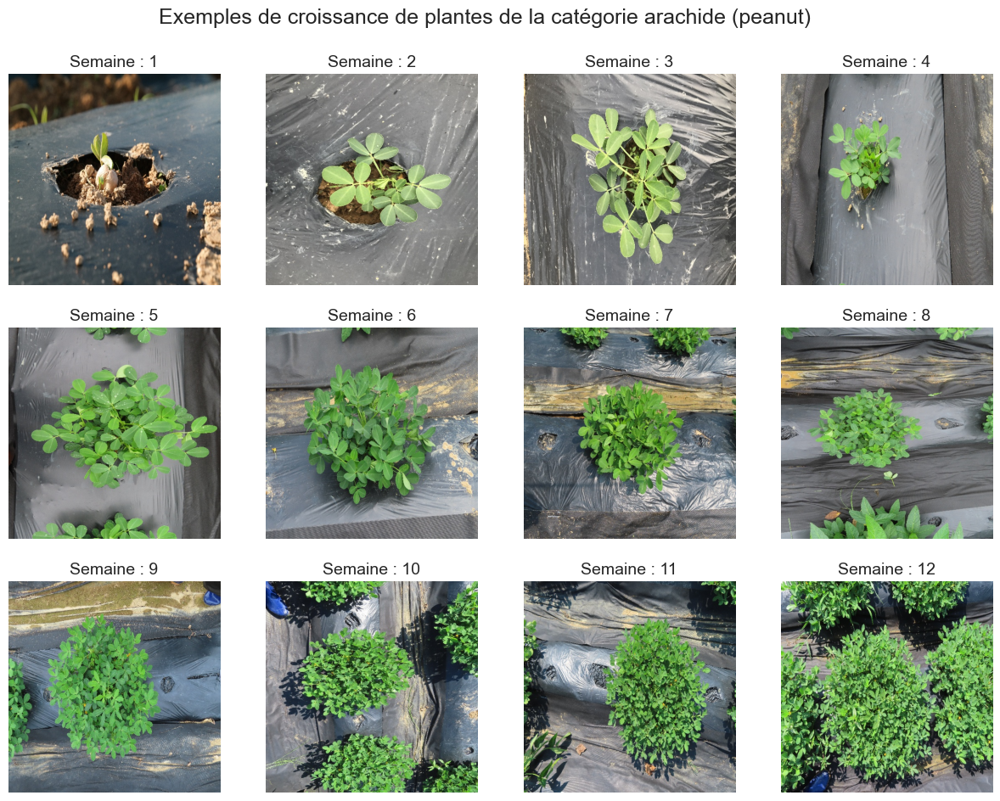

In [9]:
# Filtrage des données pour la classe "peanut"
peanut_data = data[data['label'] == 'peanut']

# Récupération des valeurs uniques de croissance pour la classe "peanut"
unique_growth_values = sorted(peanut_data['growth'].unique())

# Création d'une figure et d'un subplot avec une disposition adaptée
num_rows = 3
num_cols = 4
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 11))

# Boucle sur les valeurs uniques de croissance
for i, growth in enumerate(unique_growth_values):
    # Sélection des données pour la croissance actuelle
    subset = peanut_data[peanut_data['growth'] == growth].sample(1)
    
    # Chemin d'accès à l'image
    image_path = subset['file_path'].values[0]
    
    # Calcul des indices de ligne et de colonne pour le subplot
    row_index = i // num_cols
    col_index = i % num_cols
    
    # Affichage de l'image sur le subplot correspondant
    ax = axes[row_index, col_index]
    ax.axis('off')
    ax.set_title(f"Semaine : {growth}", fontsize=14)
    image = plt.imread(image_path)
    ax.imshow(image)

# Ajout du titre
plt.suptitle("Exemples de croissance de plantes de la catégorie arachide (peanut)", fontsize=18, y=0.95)

# Affichage du graphe
plt.show()

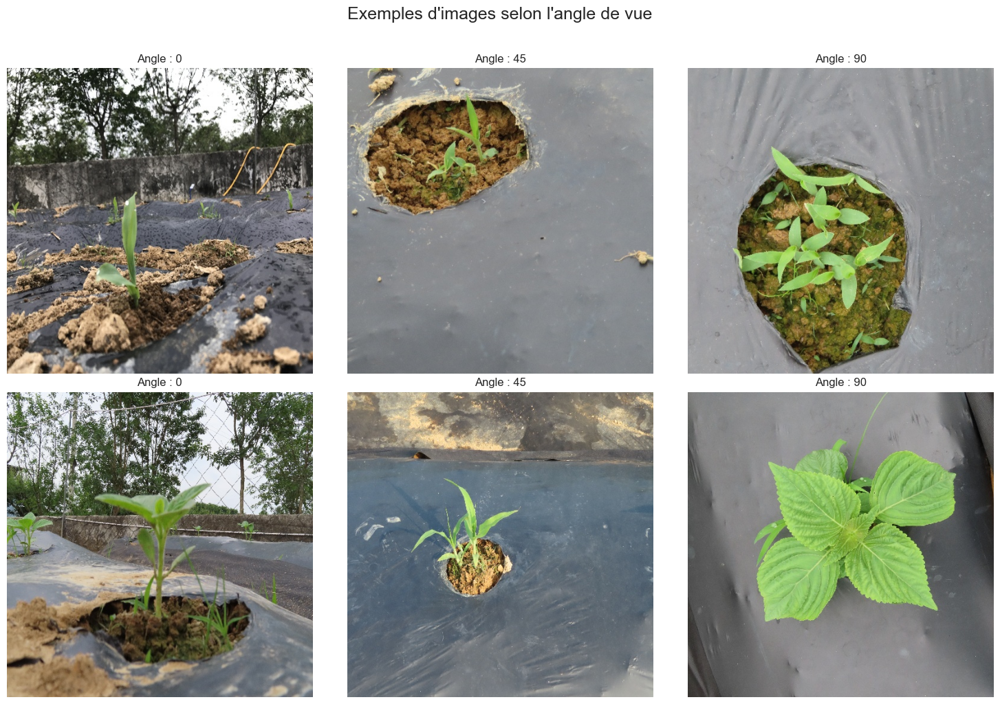

In [108]:
# Observation des photos selon les données d'angles
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# Boucle sur les angles
for i, angle in enumerate([0, 45, 90]):
    # Sélection des données pour l'angle actuel
    subset = data[data['angle'] == angle].sample(2)
    
    # Boucle sur les exemples sélectionnés
    for j, (_, row) in enumerate(subset.iterrows()):
        # Chemin d'accès à l'image
        image_path = row['file_path']
        
        # Affichage de l'image sur le subplot correspondant
        ax = axes[j, i]
        ax.axis('off')
        ax.set_title(f"Angle : {angle}", fontsize=12)
        image = plt.imread(image_path)
        ax.imshow(image)

# Ajout du titre
plt.suptitle("Exemples d'images selon l'angle de vue", fontsize=18, y=1.02)

# Affichage du graphe
plt.tight_layout()
plt.show()

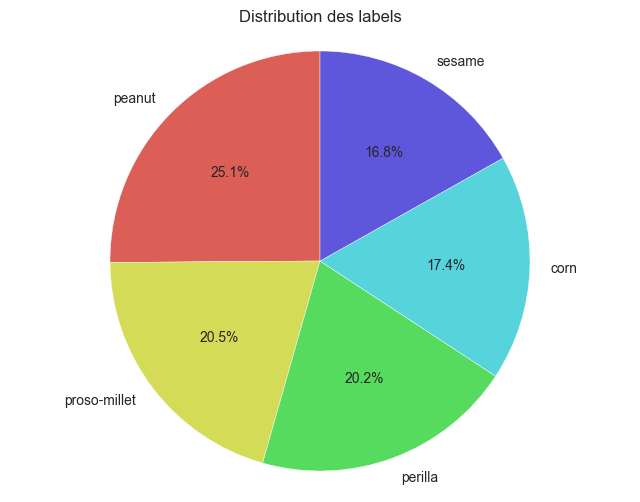

In [11]:
# Calcul de la distribution des labels
label_counts = data['label'].value_counts()

# Création du graphique circulaire
plt.figure(figsize=(8, 6))
plt.pie(label_counts, labels=label_counts.index, autopct='%1.1f%%', startangle=90, colors=df_palette)
plt.axis('equal')
plt.title('Distribution des labels')
plt.show()

Je réalise un sous-échantillonage des classes 'corn' et 'sesame' afin d'obtenir un déséquilibre plus important dans mon jeu de données.

In [12]:
# Définition de la stratégie d'échantillonnage pour la classe "sesame"
sampling_strategy = {'sesame': int(np.sum(data['label'] == 'sesame') / 6)}

# Initialisation du RandomUnderSampler avec la stratégie d'échantillonnage définie
rus = RandomUnderSampler(sampling_strategy=sampling_strategy, random_state=42)

# Ajustement de l'échantillonneur et rééchantillonnement des données
X = data.drop(columns=['label'])
y = data['label']
X_resampled, y_resampled = rus.fit_resample(X, y)

# Création du DataFrame avec les données rééchantillonnées
data_resampled_ = pd.concat([X_resampled, y_resampled], axis=1)

# Sous-échantillonnage pour la classe "corn"
sampling_strategy = {'corn': int(np.sum(data['label'] == 'corn') / 6)}
rus = RandomUnderSampler(sampling_strategy=sampling_strategy, random_state=42)
X = data_resampled_.drop(columns=['label'])
y = data_resampled_['label']
X_resampled, y_resampled = rus.fit_resample(X, y)
data_resampled = pd.concat([X_resampled, y_resampled], axis=1)

# Réinitialiser l'index du DataFrame
data_resampled = data_resampled.reset_index(drop=True)

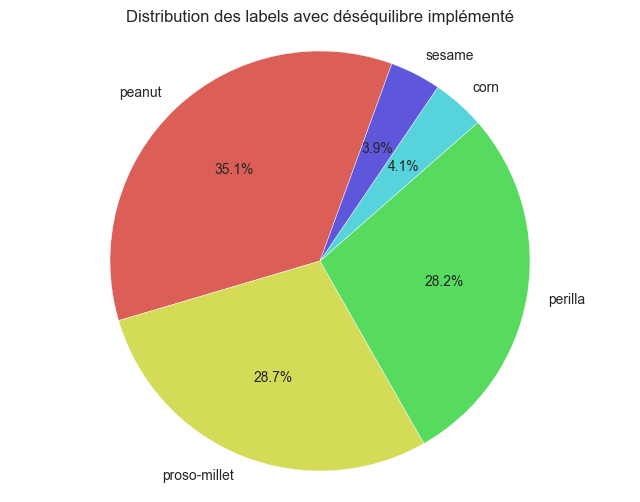

In [13]:
# Calcul de la distribution des labels
label_counts = data_resampled['label'].value_counts()

# Création du graphique circulaire
plt.figure(figsize=(8, 6))
plt.pie(label_counts, labels=label_counts.index, autopct='%1.1f%%', startangle=70, colors=df_palette)
plt.axis('equal')
plt.title('Distribution des labels avec déséquilibre implémenté')
plt.show()

Nous avons bien obtenu un jeu de données déséquilibré avec deux labels particulièrement sous-représenté.

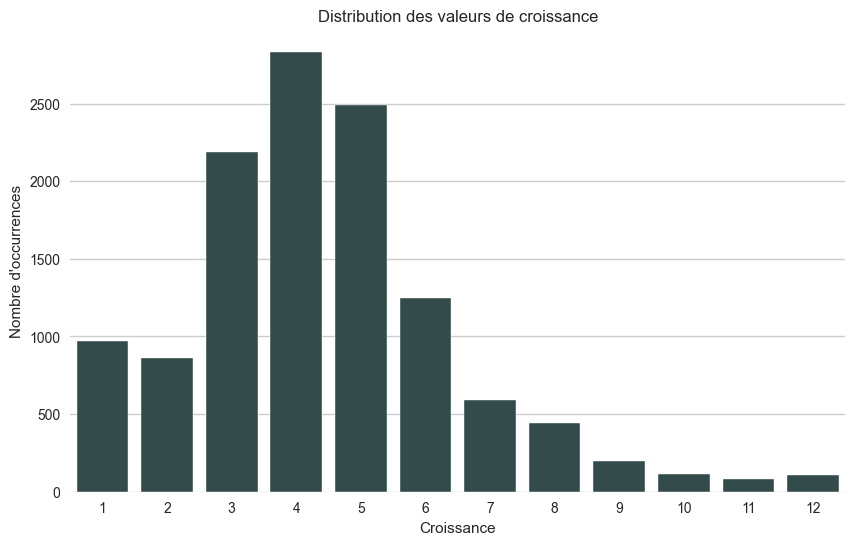

In [14]:
# Création du graphique à barres
plt.figure(figsize=(10, 6))
sns.countplot(data=data_resampled, x='growth', color='#2F4F4F')
plt.title('Distribution des valeurs de croissance')
plt.xlabel('Croissance')
plt.ylabel('Nombre d\'occurrences')
plt.show()

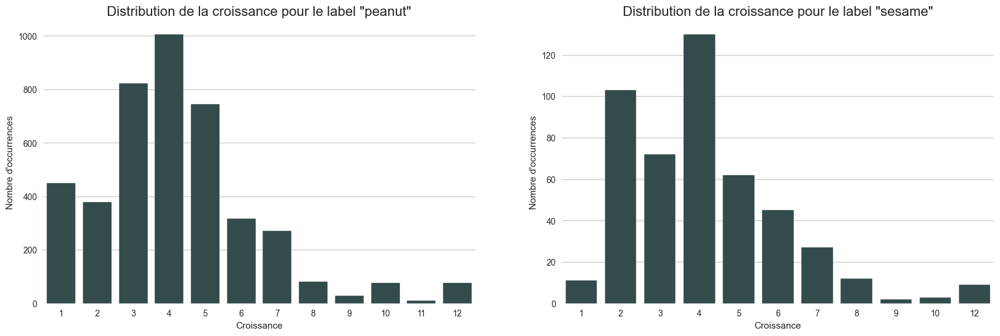

In [15]:
# Obtenir le label le plus présent et le moins présent
most_common_label = data_resampled['label'].value_counts().idxmax()
least_common_label = data_resampled['label'].value_counts().idxmin()

# Sélectionner les données pour chaque label
data_most_common = data_resampled[data_resampled['label'] == most_common_label]
data_least_common = data_resampled[data_resampled['label'] == least_common_label]

# Création des sous-graphiques
fig, axes = plt.subplots(1, 2, figsize=(20, 6))

# Graphique pour le label le plus présent
sns.countplot(data=data_most_common, x='growth', ax=axes[0], color='#2F4F4F')
axes[0].set_title('Distribution de la croissance pour le label "peanut"', fontsize=16)
axes[0].set_xlabel('Croissance')
axes[0].set_ylabel('Nombre d\'occurrences')

# Graphique pour le label le moins présent
sns.countplot(data=data_least_common, x='growth', ax=axes[1], color='#2F4F4F')
axes[1].set_title('Distribution de la croissance pour le label "sesame"', fontsize=16)
axes[1].set_xlabel('Croissance')
axes[1].set_ylabel('Nombre d\'occurrences')

# Affichage des graphiques
plt.show()

La distribution du nombre de semaines de croissance par plante est déjà déséquilibrée.

## <font color="#114b98" id="section_3">3. Préparation des données</font>

In [16]:
# Je vais expérimenter la création de bounding boxes à l'aide des niveaux de verts présents dans l'image
def get_image_with_bounding_box(image_path):
    # Charger l'image
    image = cv2.imread(image_path)
    
    # Convertir l'image en espace de couleurs HSV
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Définir la plage de couleurs vertes dans l'espace HSV
    lower_green = np.array([30, 100, 100])
    upper_green = np.array([85, 255, 255])

    # Créer un masque pour isoler les zones vertes
    mask = cv2.inRange(hsv, lower_green, upper_green)

    # Trouver les contours dans le masque
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Si aucun contour n'a été trouvé, retourner l'image originale
    if not contours:
        return image

    # Sinon, obtenir le contour ayant la plus grande aire
    max_contour = max(contours, key=cv2.contourArea)

    # Dessiner une bounding box autour du contour le plus grand
    x, y, w, h = cv2.boundingRect(max_contour)
    cv2.rectangle(image, (x, y), (x+w, y+h), (0, 255, 0), 2)  # Vert

    return image

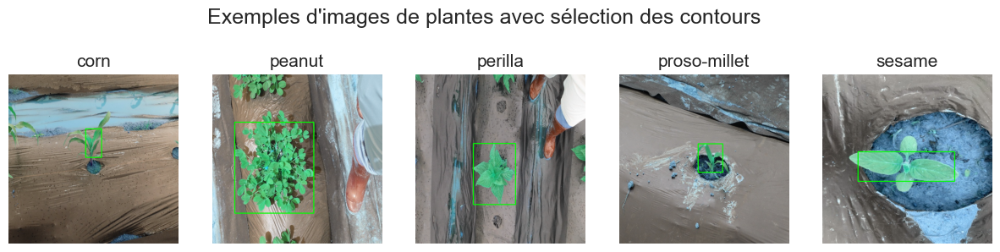

In [111]:
# Création d'une figure et d'un subplot 1 x 5
fig, axes = plt.subplots(1, 5, figsize=(15, 4))

# Boucle sur les types de label
for i, label in enumerate(data['label'].unique()):
    # Sélection des données pour le label actuel
    subset = data_resampled[data_resampled['label'] == label].sample(1)
    
    # Chemin d'accès à l'image
    image_path = subset['file_path'].values[0]
    
    # Obtention de l'image avec la bounding box
    image_with_bbox = get_image_with_bounding_box(image_path)
    
    # Affichage de l'image sur le subplot correspondant
    ax = axes[i]
    ax.axis('off')
    ax.set_title(label, fontsize=15)
    ax.imshow(image_with_bbox)

# Ajout du titre
plt.suptitle("Exemples d'images de plantes avec sélection des contours", fontsize=18, y=0.94)

# Affichage du graphe
plt.show()


Cette méthode semble très bien fonctionner. Je décide de découper mes images afin d'avoir de nouvelles image plus pertinentes.

In [18]:
# Définir le chemin du nouveau répertoire des images rognées
new_dir_path = path + 'data_cropped/'
data_resampled['new_file_path'] = ""

# Créer le nouveau répertoire s'il n'existe pas
if not os.path.exists(new_dir_path):
    os.makedirs(new_dir_path)

# Modifier la fonction get_image_with_bounding_box pour retourner également les coordonnées de la bounding box
def create_images_from_bounding_box(image_path):
    # Charger l'image
    image = cv2.imread(image_path)
    
    # Convertir l'image en espace de couleurs HSV
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Définir la plage de couleurs vertes dans l'espace HSV
    lower_green = np.array([30, 100, 100])
    upper_green = np.array([85, 255, 255]) 

    # Créer un masque pour isoler les zones vertes
    mask = cv2.inRange(hsv, lower_green, upper_green)

    # Trouver les contours dans le masque
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Si aucun contour n'a été trouvé, retourner l'image originale et des coordonnées nulles
    if not contours:
        return image, (0, 0, image.shape[1], image.shape[0])

    # Sinon, obtenir le contour ayant la plus grande aire
    max_contour = max(contours, key=cv2.contourArea)

    # Calculer la bounding box autour du contour le plus grand
    x, y, w, h = cv2.boundingRect(max_contour)

    return image, (x, y, w, h)

# Parcourir chaque image dans le DataFrame
for idx, row in data_resampled.iterrows():
    # Créer le nouveau chemin de fichier
    new_file_path = os.path.join(new_dir_path, os.path.relpath(row['file_path'], dataset_dir))

    # Si l'image n'existe pas, la créer
    if not os.path.exists(new_file_path):
        image, (x, y, w, h) = create_images_from_bounding_box(row['file_path'])

        # Rogner l'image
        cropped_image = image[y:y+h, x:x+w]

        # Créer le nouveau sous-répertoire s'il n'existe pas
        new_sub_dir_path = os.path.dirname(new_file_path)
        if not os.path.exists(new_sub_dir_path):
            os.makedirs(new_sub_dir_path)

        # Enregistrer l'image rognée
        cv2.imwrite(new_file_path, cropped_image)

    # Mettre à jour le nouveau chemin de fichier dans le DataFrame (que l'image existe déjà ou non)
    data_resampled.loc[idx, 'new_file_path'] = new_file_path

Je vais observer les dimensions de ces nouvelles images.

In [19]:
# Créer deux listes vides pour stocker les hauteurs et les largeurs
heights = []
widths = []

# Parcourir tous les chemins de fichiers dans la colonne 'new_file_path'
for file_path in data_resampled['new_file_path']:
    # Ouvrir l'image
    with Image.open(file_path) as img:
        # Obtenir les dimensions de l'image
        width, height = img.size

    # Ajouter les dimensions à leurs listes respectives
    heights.append(height)
    widths.append(width)

# Convertir les listes en objets pandas Series pour faciliter la manipulation des données
heights = pd.Series(heights)
widths = pd.Series(widths)

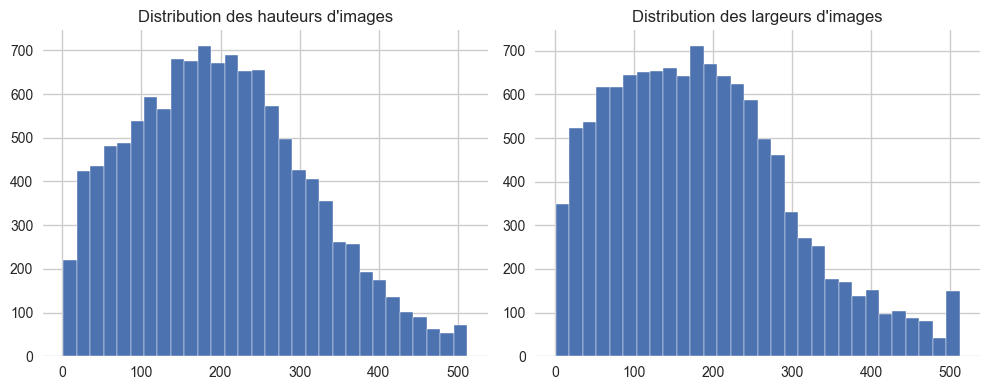

In [20]:
# Afficher un histogramme pour les hauteurs
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.hist(heights, bins=30)
plt.title("Distribution des hauteurs d'images")

# Afficher un histogramme pour les largeurs
plt.subplot(1, 2, 2)
plt.hist(widths, bins=30)
plt.title("Distribution des largeurs d'images")

plt.tight_layout()
plt.show()

Je décide de ne pas supprimer les images qui ont un nombre très faibles de pixels, que ce soit en hauteur ou en largeur, car ce sont des images qui devraient appartenir pour la plupart à une croissance de 1 ou de 2.

In [21]:
data_resampled.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12132 entries, 0 to 12131
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   file_path      12132 non-null  object
 1   growth         12132 non-null  int64 
 2   angle          12132 non-null  int64 
 3   label          12132 non-null  object
 4   new_file_path  12132 non-null  object
dtypes: int64(2), object(3)
memory usage: 474.0+ KB


In [22]:
# Encodage des 'labels'
le = LabelEncoder()
data_resampled['label_encoded'] = le.fit_transform(data_resampled['label'])
num_classes = len(le.classes_)

label_str = {
    0: 'corn',
    1: 'peanut',
    2: 'perilla',
    3: 'proso-millet',
    4: 'sesame'
}

# data_resampled = data_resampled.sample(2000)


# Division du DataFrame en un ensemble d'entraînement (70 %) et un ensemble de validation-test (30 %)
train_df, test_val_df = train_test_split(data_resampled, test_size=0.3, random_state=42)

# Division de l'ensemble de validation-test en un ensemble de test (15 %) et un ensemble de validation (15 %)
test_df, val_df = train_test_split(test_val_df, test_size=0.5, random_state=42)

# Définition des générateurs
train_datagen = ImageDataGenerator(
    rotation_range=5,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)

train_generator = train_datagen.flow_from_dataframe(
    train_df,
    x_col='new_file_path',
    y_col=['label_encoded', 'growth'],
    target_size=image_size,
    batch_size=batch_size,
    class_mode='multi_output',
    color_mode="rgb",
    shuffle=True,
    seed=42,
)

val_generator = ImageDataGenerator().flow_from_dataframe(
    val_df,
    x_col='new_file_path',
    y_col=['label_encoded', 'growth'],
    target_size=image_size,
    batch_size=batch_size,
    class_mode='multi_output',
    color_mode="rgb",
    shuffle=True,
    seed=42,
)

test_generator = ImageDataGenerator().flow_from_dataframe(
    test_df,
    x_col='new_file_path',
    y_col=['label_encoded', 'growth'],
    target_size=image_size,
    batch_size=batch_size,
    class_mode='multi_output',
    color_mode="rgb",
    shuffle=True,
    seed=42,
)

Found 8492 validated image filenames.
Found 1820 validated image filenames.
Found 1820 validated image filenames.


In [23]:
total_samples = train_generator.n
image_shape = train_generator.image_shape
batch_size = train_generator.batch_size
number_of_batches = len(train_generator)
images, labels = next(train_generator)

print("Total samples:", total_samples)
print("Image shape:", image_shape)
print("Batch size:", batch_size)
print("Number of batches:", number_of_batches)
print("Min pixel value:", np.min(images))
print("Max pixel value:", np.max(images))

Total samples: 8492
Image shape: (224, 224, 3)
Batch size: 32
Number of batches: 266
Min pixel value: 0.0
Max pixel value: 255.0


{0: 'corn', 1: 'peanut', 2: 'perilla', 3: 'proso-millet', 4: 'sesame'}


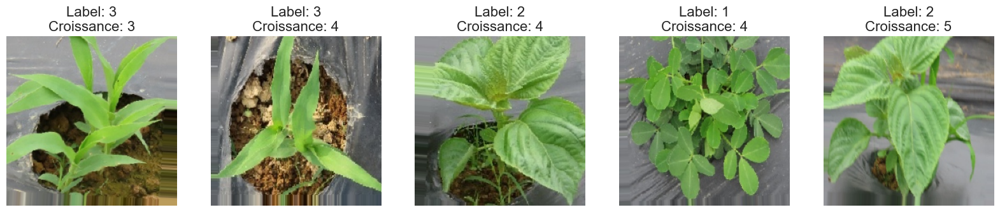

In [112]:
# Création d'une figure et d'axes
fig, axs = plt.subplots(1, 5, figsize=(20, 4))

# Obtenir le prochain lot d'images et d'étiquettes
images, (labels, growths) = train_generator.next()

# Parcourir chaque image et chaque axe
for i, (img, lbl, growth, ax) in enumerate(zip(images[:5], labels[:5], growths[:5], axs)):
    ax.imshow(img.astype('uint8'))
    ax.set_title(f"Label: {lbl}\nCroissance: {growth}", fontsize=16)
    ax.axis('off')

# Affichage de la figure
print(label_str)
plt.show()

## <font color="#114b98" id="section_4">4. Modèle MobileNetV3Small - Baseline</font>

In [25]:
# Fonction de calcul du F1-Score Macro pour les labels des epsèces
def f1_macro(y_true, y_pred):
    y_pred_labels = tf.argmax(y_pred, axis=1)
    y_pred_labels = tf.expand_dims(y_pred_labels, axis=1)
    
    return f1_score(y_true.numpy(), y_pred_labels.numpy(), average='macro')

# Définition de la fonction de création de modèle pour Keras Tuner
def build_model(hp):
    
    # Définition de la couche d'entrée
    input_layer = Input(input_shape)
    
    # Chargement du modèle pré-entraîné
    base_model = MobileNetV3Small(
        weights='imagenet',
        include_top=False,
        input_tensor=input_layer,
        minimalistic = True
    )
    
    # Dégel de toutes les couches du modèle
    for layer in base_model.layers:
        layer.trainable = True
             
    # Ajout des nouvelles couches
    x = GlobalAveragePooling2D()(base_model.output)
    x = Flatten()(x)

    dense_size = hp.Choice('dense_size', [128, 256, 512, 1024, 2048])
    dropout_rate = hp.Float('dropout_rate', min_value=0.1, max_value=0.9, step=0.1)

    x_label = Dense(dense_size, activation='relu', kernel_initializer='he_normal')(x)
    x_label = Dropout(dropout_rate)(x_label)
    label_output = Dense(num_classes, activation='softmax', name='label')(x_label)
    
    x_growth = Dense(dense_size, activation='relu', kernel_initializer='he_normal')(x)
    x_growth = Dropout(dropout_rate)(x_growth)
    growth_output = Dense(1, activation='relu', name='growth')(x_growth)
   
    # Combinaison du modèle de base et des nouvelles couches de classification
    model = Model(inputs=input_layer, 
                  outputs=[label_output, growth_output],
                  name="model_mn")

    learning_rate = hp.Choice('learning_rate', [0.001, 0.0001])
    
    # Compilation du modèle
    model.compile(
        optimizer=Adam(lr=learning_rate, clipnorm=1.0),
        loss={
            'label': 'sparse_categorical_crossentropy',
            'growth': 'mae'   
        },
        metrics={
            'label': f1_macro,
            'growth': 'mae'
        },
    )

    return model   

# Définition des objectifs
label_f1_objective = Objective(name="val_label_f1_macro", direction="max")
growth_mae_objective = Objective(name="val_growth_mae", direction="min")


# Ajout de l'EarlyStopping
def build_callbacks():
    return [EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)]

EPOCHS = 20
MAX_TRIALS = 25

# Utilisation de BayesianOptimization
tuner = BayesianOptimization(
    build_model,
    objective=[label_f1_objective, growth_mae_objective],
    max_trials=MAX_TRIALS,
    num_initial_points=5,
    directory="keras_tuner_v2",
    project_name="tuner_hp_mn",
    overwrite=True
)

# # Recherche du meilleur modèle
# tuner.search(train_generator,
#              epochs=EPOCHS,
#              validation_data=val_generator,
#              callbacks=[build_callbacks()])

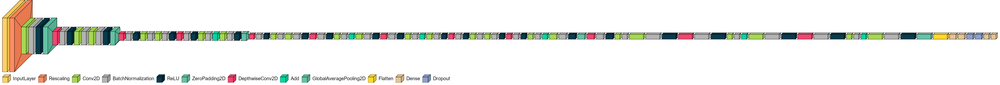

In [26]:
# # Impression des meilleurs hyperparamètres
# print("Best hyperparameters:", tuner.get_best_hyperparameters()[0].values)

# # Sauvegarde des meilleurs hyperparamètres
# best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
# with open(path + "best_hp_mn.pkl", "wb") as f:
#     pickle.dump(best_hps, f)
    
# Chargement des meilleurs hyperparamètres
with open(path + "best_hp_mn.pkl", "rb") as f:
    loaded_best_hps = pickle.load(f)

# Construction du modèle avec les meilleurs hyperparamètres
model_mn = build_model(loaded_best_hps)    

# Visualisation du modèle
visualkeras.layered_view(model_mn, legend=True,  scale_xy=1, font=font, max_z=1000, color_map=color_map)    

In [27]:
# Best hyperparameters: {'dense_size': 256, 'dropout_rate': 0.2, 'learning_rate': 0.0001}

In [28]:
# Création du rappel
early_stopping = EarlyStopping(
    patience=5,
    monitor='val_loss',
    restore_best_weights=True)

# # Entraînement du modèle
# history = model_mn.fit(
#     train_generator,
#     epochs=EPOCHS,
#     validation_data=val_generator,
#     callbacks=[early_stopping]
# )

# # Sauvegarde du modèle
# model_mn.save(path + 'mod_mn.h5')

In [29]:
def plot_epochs(history):
    fig, ax = plt.subplots(2, 2, figsize=(12, 10))

    ax[0, 0].plot(history.history['growth_mae'])
    ax[0, 0].plot(history.history['val_growth_mae'])
    ax[0, 0].set_title('Growth MAE', size=16)
    ax[0, 0].set_ylabel('Mean Absolute Error')
    ax[0, 0].legend(['Train', 'Validation'], loc='upper left')

    ax[1, 0].plot(history.history['growth_loss'])
    ax[1, 0].plot(history.history['val_growth_loss'])
    ax[1, 0].set_title('Growth Loss', size=16)
    ax[1, 0].set_ylabel('Loss')
    ax[1, 0].legend(['Train', 'Validation'], loc='upper right')

    ax[0, 1].plot(history.history['label_f1_macro'])
    ax[0, 1].plot(history.history['val_label_f1_macro'])
    ax[0, 1].set_title('Label F1 Score Macro', size=16)
    ax[0, 1].set_ylabel('F1 Score Macro')
    ax[0, 1].legend(['Train', 'Validation'], loc='upper left')

    ax[1, 1].plot(history.history['label_loss'])
    ax[1, 1].plot(history.history['val_label_loss'])
    ax[1, 1].set_title('Label Loss', size=16)
    ax[1, 1].set_ylabel('Loss')
    ax[1, 1].legend(['Train', 'Validation'], loc='upper right')

    for i in range(2):
        for j in range(2):
            ax[i, j].set_xlabel('Epoch')
            ax[i, j].xaxis.set_major_locator(ticker.MaxNLocator(integer=True))

    plt.tight_layout()
    plt.show()

# plot_epochs(history)

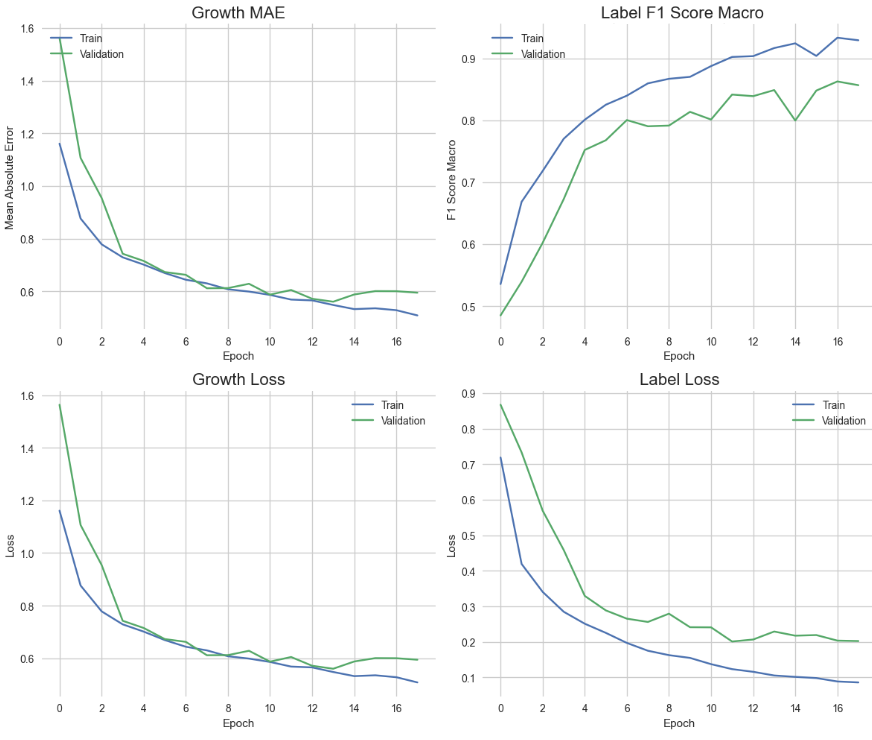

In [30]:
custom_objects = {'f1_macro': f1_macro}

# Chargement du modèle avec les objets personnalisés
model_mn = load_model(path + 'mod_mn.h5', custom_objects=custom_objects)

In [31]:
# Définition d'une fonction pour décoder les étiquettes 
def decode_labels(encoded_label, growth):
    label_str = le.inverse_transform([encoded_label])[0]
    growth_str = int(growth)
    return f"Label: {label_str}\n Growth: {growth_str}"

def plot_true_pred_labels(model, test_generator):
    test_images, test_labels = next(test_generator)
    predictions = model.predict(test_images)
    fig, axes = plt.subplots(1, 5, figsize=(20, 8))
    for i in range(5):
        true_label, true_growth = test_labels[0][i], test_labels[1][i]
        true_title = decode_labels(true_label, true_growth)
        pred_label, pred_growth = np.argmax(predictions[0][i]), predictions[1][i]
        pred_title = decode_labels(pred_label, pred_growth)
        resized_image = cv2.resize((test_images[i]).astype('uint8'), (200, 200), interpolation=cv2.INTER_AREA)
        axes[i].imshow(resized_image)
        axes[i].set_title(f'True: {true_title}', fontsize=16)
        axes[i].axis('off')
        axes[i].text(0.5, -0.18, f'Pred: {pred_title}', size=16, ha="center", transform=axes[i].transAxes)
    plt.show()

1/1 [==============================] - 2s 2s/step


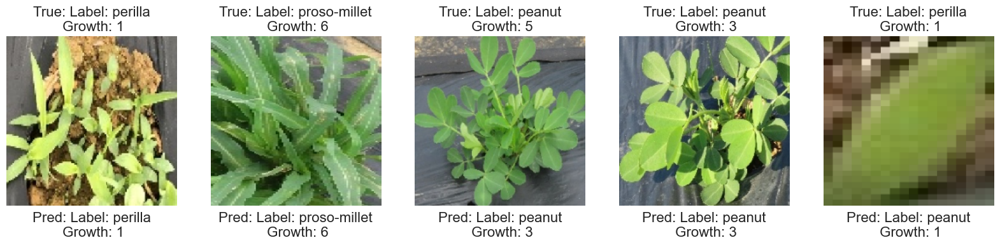

In [32]:
plot_true_pred_labels(model_mn, test_generator)

In [33]:
def get_true_and_pred_labels(test_generator, model):
    true_label_labels = []
    true_growth_labels = []
    true_images = []
    
    pred_label_labels = []
    pred_growth_labels = []
    

    for i, (images, labels) in enumerate(test_generator):
        # Stockage des vrais labels
        true_label_labels.extend(labels[0].tolist())
        true_growth_labels.extend(labels[1].tolist())
        true_images.extend(images)
        
        # Prédiction avec le modèle
        preds = model.predict(images, verbose=0)
        
        # Stockage des labels prédits
        pred_label_labels.extend(np.argmax(preds[0], axis=-1).tolist())
        pred_growth_labels.extend(np.rint(preds[1]).tolist())
        
        
        if i+1 >= test_generator.n // test_generator.batch_size:
            break
    
    # Suppression des dimensions inutiles
    pred_label_labels = np.squeeze(pred_label_labels).tolist()
    pred_growth_labels = np.squeeze(pred_growth_labels).tolist()
    
    
    # Récupération des vrais labels et des labels prédits sous forme de np.array
    true_labels = np.vstack([true_label_labels, true_growth_labels])
    pred_labels = np.vstack([pred_label_labels, pred_growth_labels])
    
    # Conversion des images en tableau NumPy
    true_images = np.array(true_images)

    return true_labels, pred_labels, true_images

In [34]:
true_labels, pred_labels, true_images = get_true_and_pred_labels(test_generator, model_mn)

In [35]:
# Calcul du F1-score macro
f1_ = f1_score(true_labels[0], pred_labels[0], average='macro')
dict_label_f1_score['Baseline'] = f1_
print(f"F1-Score Macro: {f1_:.3f}")
print("\nClassification report for labels :")
print(classification_report(true_labels[0], pred_labels[0]))

F1-Score Macro: 0.845

Classification report for labels :
              precision    recall  f1-score   support

           0       0.86      0.57      0.69        87
           1       0.95      0.98      0.96       616
           2       0.92      0.95      0.93       526
           3       0.93      0.96      0.95       486
           4       0.93      0.55      0.69        73

    accuracy                           0.93      1788
   macro avg       0.92      0.80      0.85      1788
weighted avg       0.93      0.93      0.93      1788



In [36]:
def plot_confusion_matrix(true_labels, pred_labels):
    cm = confusion_matrix(true_labels[0, :], pred_labels[0, :])
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    fig, ax = plt.subplots(1, 2, figsize=(16, 6))

    # Matrice de confusion non normalisée
    sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', square=True, cbar=False,
                annot_kws={"fontsize": 15}, ax=ax[0])
    ax[0].set_xlabel('Prédictions', fontsize=15)
    ax[0].set_ylabel('Étiquettes', fontsize=15)
    ax[0].set_title('Matrice de confusion', fontsize=18)
    ax[0].set_xticklabels(le.classes_, fontsize=12)
    ax[0].set_yticklabels(le.classes_, fontsize=12)

    # Matrice de confusion normalisée
    sns.heatmap(cm_norm, annot=True, cmap='Blues', fmt='.2f', square=True, cbar=False,
                annot_kws={"fontsize": 15}, ax=ax[1])
    ax[1].set_xlabel('Prédictions', fontsize=15)
    ax[1].set_ylabel('Étiquettes', fontsize=15)
    ax[1].set_title('Matrice de confusion normalisée', fontsize=18)
    ax[1].set_xticklabels(le.classes_, fontsize=12)
    ax[1].set_yticklabels(le.classes_, fontsize=12)

    plt.tight_layout()
    plt.show()

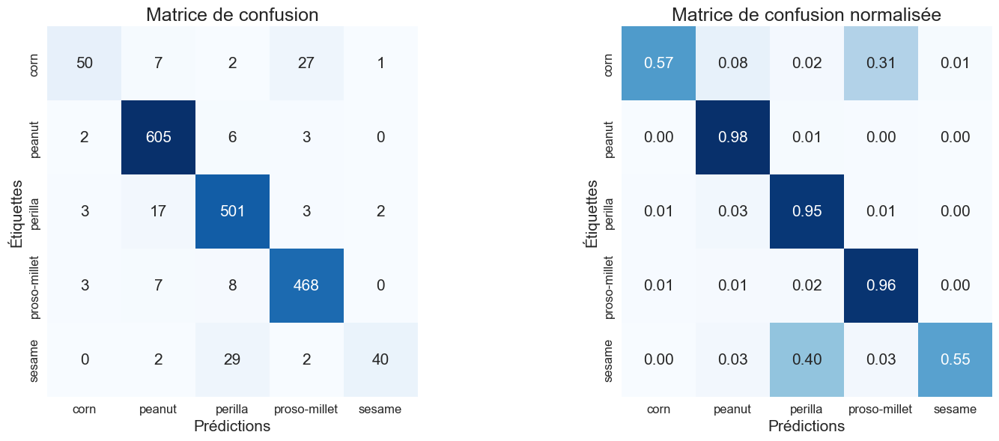

In [37]:
plot_confusion_matrix(true_labels, pred_labels)

In [38]:
# Calcul de la MAE
mae = mean_absolute_error(true_labels[1], pred_labels[1])
dict_growth_mae['Baseline'] = mae
print(f"Croissance MAE : {mae:.3f}")

Croissance MAE : 0.508


In [39]:
def plot_growth_mae_box(true_labels, pred_labels):
    growth_errors = np.abs(true_labels[1] - pred_labels[1])
    growth_error_df = pd.DataFrame({'Growth': true_labels[1], 'Error': growth_errors})
    means = growth_error_df.groupby('Growth')['Error'].mean()
    x_locs = range(len(means))
    
    plt.figure(figsize=(10, 6))
    ax = sns.boxplot(data=growth_error_df, x='Growth', y='Error', showfliers=True)
    legend_added = False
    for x, mean in zip(x_locs, means):
        ax.plot(x, mean, 'ko')
        if not legend_added:
            ax.plot(x, mean, 'ko', label='Valeurs moyennes')
            legend_added = True

    plt.xlabel('Croissance', fontsize=15)
    plt.ylabel('MAE', fontsize=15)
    plt.title('Erreur absolue moyenne par valeur de croissance', fontsize=18)
    plt.grid(True)
    plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')

    plt.show()

In [40]:
def plot_growth_mae_box(true_labels, pred_labels):
    growth_errors = np.abs(true_labels[1] - pred_labels[1])
    growth_error_df = pd.DataFrame({'Growth': true_labels[1], 'Error': growth_errors})
    means = growth_error_df.groupby('Growth')['Error'].mean()
    x_locs = range(len(means))
    
    plt.figure(figsize=(10, 6))
    ax = sns.boxplot(data=growth_error_df, x='Growth', y='Error', showfliers=True)
    legend_added = False
    for x, mean in zip(x_locs, means):
        ax.plot(x, mean, 'r*', markersize=8) 
        if not legend_added:
            ax.plot(x, mean, 'r*', markersize=8, label='Valeurs moyennes')
            legend_added = True

    plt.xlabel('Croissance', fontsize=15)
    plt.ylabel('MAE', fontsize=15)
    plt.title('Erreur absolue moyenne par valeur de croissance', fontsize=18)
    plt.grid(True)
    plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')

    plt.show()


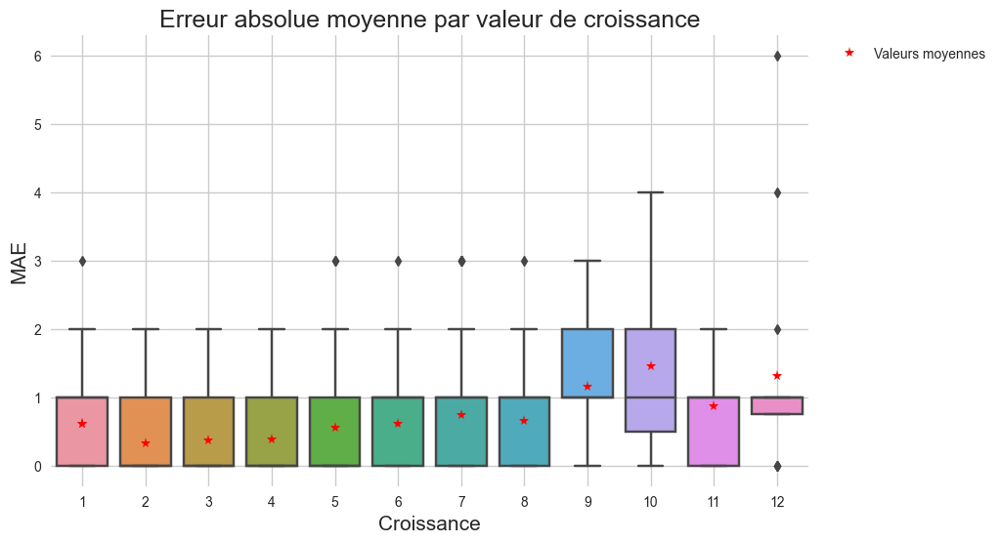

In [41]:
plot_growth_mae_box(true_labels, pred_labels)

## <font color="#114b98" id="section_5">5. Pondération des échantillons lors de l'entraînement</font>

In [42]:
'''
Inverse du nombre d'échantillons (INS) :
Cette méthode attribue un poids à chaque échantillon en tant 
qu'inverse de la fréquence de la classe à laquelle il appartient. 
Elle a tendance à mettre plus l'accent sur les classes minoritaires, 
ce qui peut aider le modèle à apprendre les modèles de la classe 
sous-représentée plus efficacement.
'''

def compute_sample_weights(y):
    class_counts = np.bincount(y)
    sample_weights = 1 / class_counts[y]
    sample_weights /= np.sum(sample_weights)
    return sample_weights

train_weights_eth = compute_sample_weights(train_df['label_encoded'])

train_generator_w = train_datagen.flow_from_dataframe(
    train_df,
    x_col='new_file_path',
    y_col=['label_encoded', 'growth'],
    target_size=image_size,
    batch_size=batch_size,
    class_mode='multi_output',
    color_mode="rgb",
    shuffle=True,
    seed=42,
    sample_weight=train_weights_eth,
)

# Chargement des meilleurs hyperparamètres
with open(path + "best_hp_mn.pkl", "rb") as f:
    loaded_best_hps = pickle.load(f)

# Construction du modèle avec les meilleurs hyperparamètres
model_mn_w = build_model(loaded_best_hps)

# # Entraînement du modèle
# history = model_mn_w.fit(
#     train_generator_w,
#     epochs=EPOCHS,
#     validation_data=val_generator,
#     callbacks=[early_stopping]
# )

# # Sauvegarde du modèle
# model_mn_w.save(path + 'mod_mn_w.h5')

Found 8492 validated image filenames.


In [43]:
# Chargement du modèle avec les objets personnalisés
model_mn_w = load_model(path + 'mod_mn_w.h5', custom_objects=custom_objects)

1/1 [==============================] - 0s 62ms/step


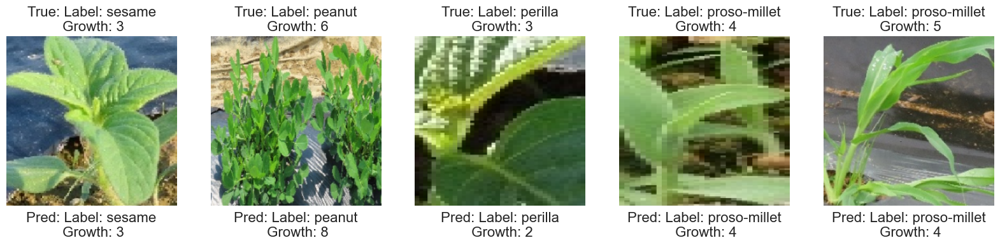

In [44]:
plot_true_pred_labels(model_mn_w, test_generator)

In [45]:
true_labels_w, pred_labels_w, true_images_w = get_true_and_pred_labels(test_generator, model_mn_w)

In [46]:
# Calcul du F1-score macro
f1_ = f1_score(true_labels_w[0], pred_labels_w[0], average='macro')
dict_label_f1_score['Weighted'] = f1_
print(f"F1-Score Macro: {f1_:.3f}")
print("\nClassification report for labels :")
print(classification_report(true_labels_w[0], pred_labels_w[0]))

F1-Score Macro: 0.846

Classification report for labels :
              precision    recall  f1-score   support

           0       0.91      0.56      0.69        89
           1       0.93      0.98      0.96       614
           2       0.93      0.93      0.93       530
           3       0.93      0.98      0.95       482
           4       0.88      0.58      0.69        73

    accuracy                           0.93      1788
   macro avg       0.92      0.81      0.85      1788
weighted avg       0.93      0.93      0.92      1788



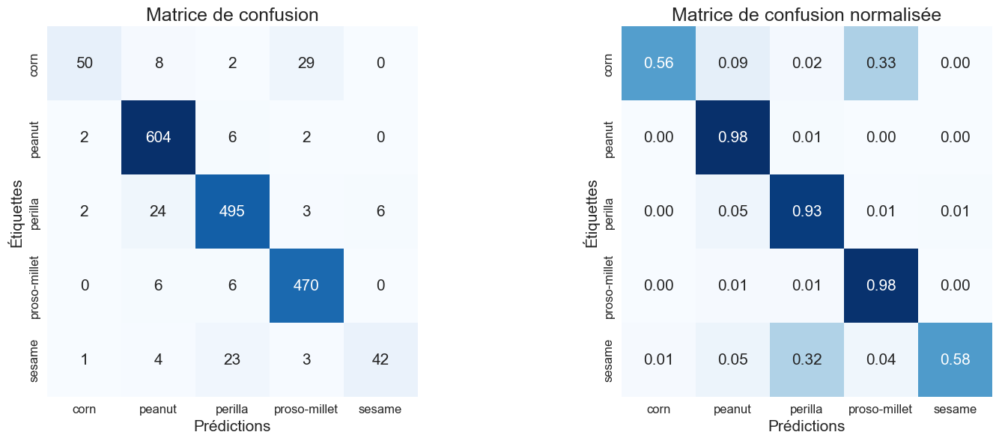

In [47]:
plot_confusion_matrix(true_labels_w, pred_labels_w)

In [48]:
mae = mean_absolute_error(true_labels_w[1], pred_labels_w[1])
dict_growth_mae['Weighted'] = mae
print(f"Croissance MAE : {mae:.3f}")

Croissance MAE : 0.481


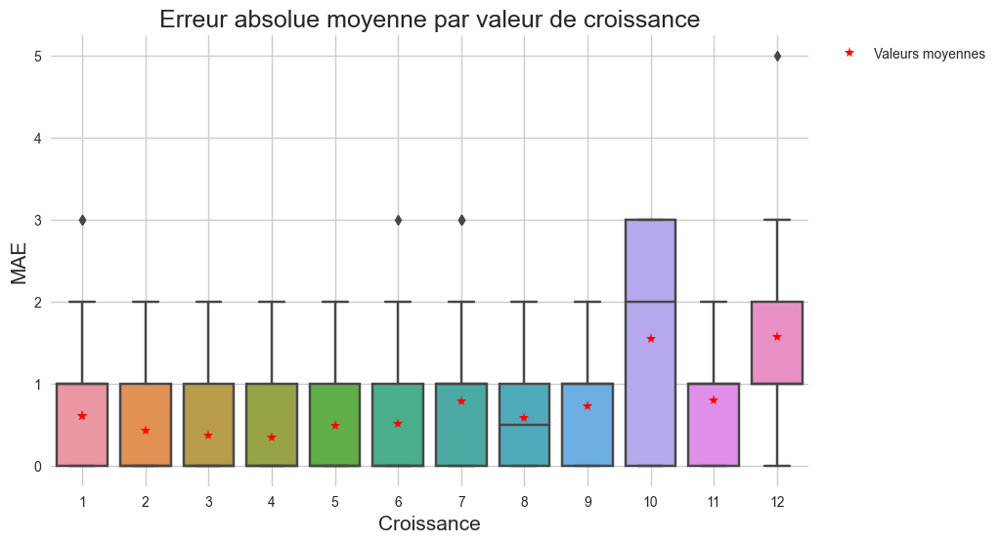

In [49]:
plot_growth_mae_box(true_labels_w, pred_labels_w)

In [50]:
def plot_comparison(dict_growth_mae, dict_label_f1_score):
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))
    dict_list = [dict_growth_mae, dict_label_f1_score]
    labels_list = ['Croissance MAE', 'Label F1-Score Macro']

    for i in range(2):
        dict_data = dict_list[i]
        labels = list(dict_data.keys())
        values = list(dict_data.values())
        ax = axs[i]
        ax.set_title(labels_list[i], fontsize=16)

        # Set the ylim to accommodate the text above the bars
        max_value = max(values)
        if np.isfinite(max_value):
            ax.set_ylim(0, max_value * 1.1)

        for j, v in enumerate(values):
            if np.isfinite(v):  # Check if the value is finite
                ax.text(j, v + 0.01 * max_value, f"{round(v, 3)}", ha='center', fontsize=12)
            else:
                print(f"Skipping invalid value: {v}")

        sns.barplot(x=labels, y=values, palette=sns.color_palette("rocket_r"), ax=ax)

        ax.set_xticklabels(labels, fontsize=12, rotation=90)

    plt.tight_layout()
    plt.show()


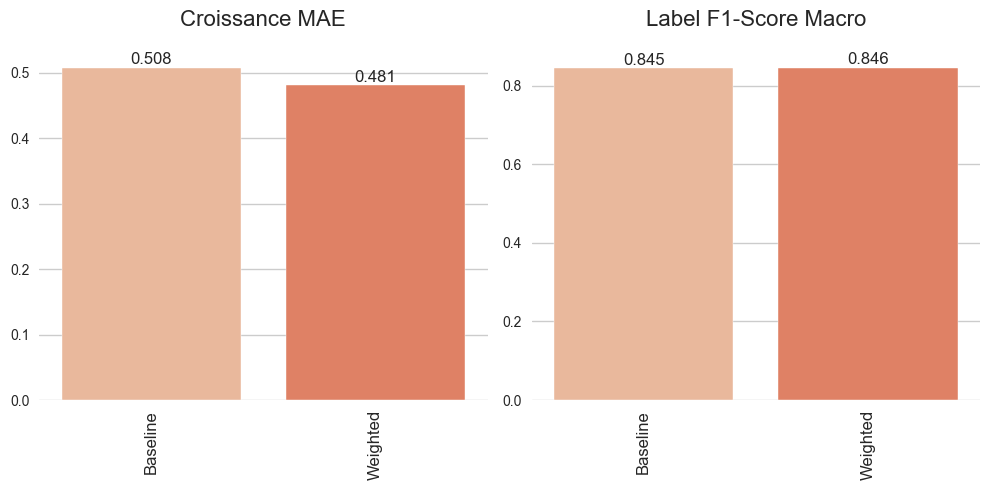

In [51]:
plot_comparison(dict_growth_mae, dict_label_f1_score)

## <font color="#114b98" id="section_6">6. Sous-échantillonage des classes majoritaires</font>

Nous choisissons de supprimer 50% des échantillons des trois classes majoritaires (peanut, perilla et proso-millet) afin d'équilibrer leur distribution.

In [52]:
# Définition de la stratégie d'échantillonnage pour chaque classe
sampling_strategy_1 = {1: int(np.sum(train_df['label_encoded'] == 1) / 2)}
sampling_strategy_2 = {2: int(np.sum(train_df['label_encoded'] == 2) / 2)}
sampling_strategy_3 = {3: int(np.sum(train_df['label_encoded'] == 3) / 2)}

# Initialisation du RandomUnderSampler avec la stratégie d'échantillonnage définie pour la classe 1
rus = RandomUnderSampler(sampling_strategy=sampling_strategy_1, random_state=42)
train_df_resampled_1, y_resampled_1 = rus.fit_resample(train_df, train_df['label_encoded'])

# Initialisation du RandomUnderSampler avec la stratégie d'échantillonnage définie pour la classe 2
rus = RandomUnderSampler(sampling_strategy=sampling_strategy_2, random_state=42)
train_df_resampled_2, y_resampled_2 = rus.fit_resample(train_df_resampled_1, y_resampled_1)

# Initialisation du RandomUnderSampler avec la stratégie d'échantillonnage définie pour la classe 3
rus = RandomUnderSampler(sampling_strategy=sampling_strategy_3, random_state=42)
X_resampled, y_resampled = rus.fit_resample(train_df_resampled_2, y_resampled_2)

# Convert resampled data to DataFrame
train_df_resampled = pd.DataFrame(X_resampled, columns=train_df.columns)
train_df_resampled['label_encoded'] = y_resampled

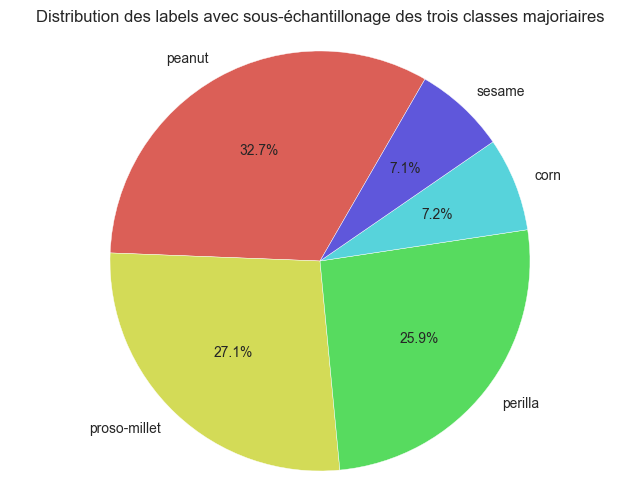

In [53]:
# Calcul de la distribution des labels
label_counts = train_df_resampled['label'].value_counts()

# Création du graphique circulaire
plt.figure(figsize=(8, 6))
plt.pie(label_counts, labels=label_counts.index, autopct='%1.1f%%', startangle=60, colors=df_palette)
plt.axis('equal')
plt.title('Distribution des labels avec sous-échantillonage des trois classes majoriaires')

# Affichage du graphique
plt.show()

In [54]:
train_generator_us = train_datagen.flow_from_dataframe(
    train_df_resampled,
    x_col='new_file_path',
    y_col=['label_encoded', 'growth'],
    target_size=image_size,
    batch_size=batch_size,
    class_mode='multi_output',
    color_mode="rgb",
    shuffle=True,
    seed=42,
)

# Chargement des meilleurs hyperparamètres
with open(path + "best_hp_mn.pkl", "rb") as f:
    loaded_best_hps = pickle.load(f)
    
# Construction du modèle avec les meilleurs hyperparamètres
model_mn_us = build_model(loaded_best_hps) 

# # Entraînement du modèle
# history = model_mn_us.fit(
#     train_generator_us,
#     epochs=EPOCHS,                            
#     validation_data=val_generator,
#     callbacks=[early_stopping]
# )

# # Sauvegarde du modèle
# model_mn_us.save(path + 'mod_mn_us.h5')

Found 4572 validated image filenames.


In [55]:
# Chargement du modèle avec les objets personnalisés
model_mn_us = load_model(path + 'mod_mn_us.h5', custom_objects=custom_objects)

1/1 [==============================] - 0s 63ms/step


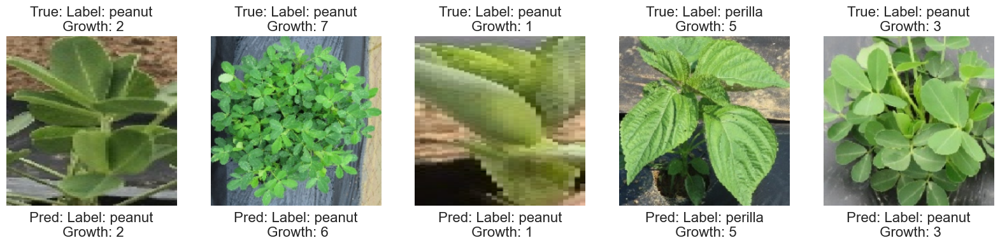

In [56]:
plot_true_pred_labels(model_mn_us, test_generator)

In [57]:
true_labels_us, pred_labels_us, true_images_us = get_true_and_pred_labels(test_generator, model_mn_us)

In [58]:
# Calcul du F1-score macro
f1_ = f1_score(true_labels_us[0], pred_labels_us[0], average='macro')
dict_label_f1_score['Down\nSampling'] = f1_
print(f"F1-Score Macro: {f1_:.3f}")
print("\nClassification report for labels :")
print(classification_report(true_labels_us[0], pred_labels_us[0]))

F1-Score Macro: 0.862

Classification report for labels :
              precision    recall  f1-score   support

           0       0.68      0.78      0.72        86
           1       0.90      0.99      0.94       613
           2       0.96      0.90      0.93       527
           3       0.97      0.90      0.93       488
           4       0.83      0.74      0.79        74

    accuracy                           0.92      1788
   macro avg       0.87      0.86      0.86      1788
weighted avg       0.92      0.92      0.92      1788



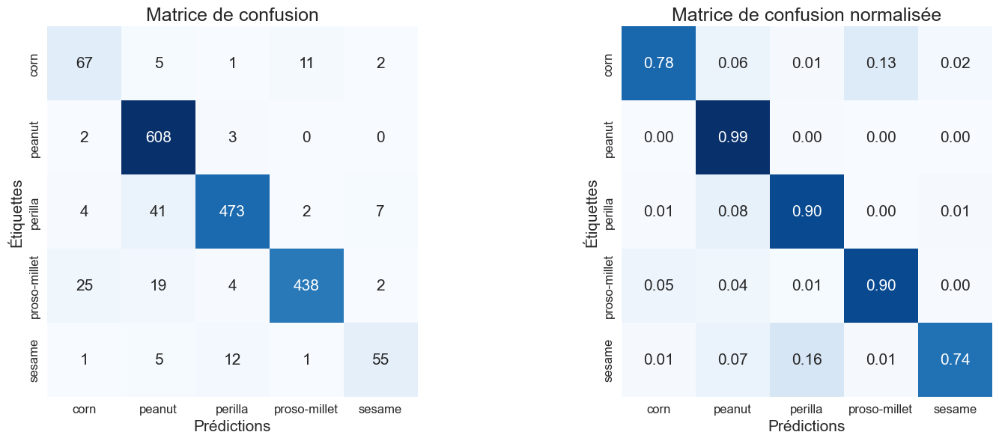

In [59]:
plot_confusion_matrix(true_labels_us, pred_labels_us)

In [60]:
mae = mean_absolute_error(true_labels_us[1], pred_labels_us[1])
dict_growth_mae['Down\nSampling'] = mae
print(f"Croissance MAE : {mae:.3f}")

Croissance MAE : 0.575


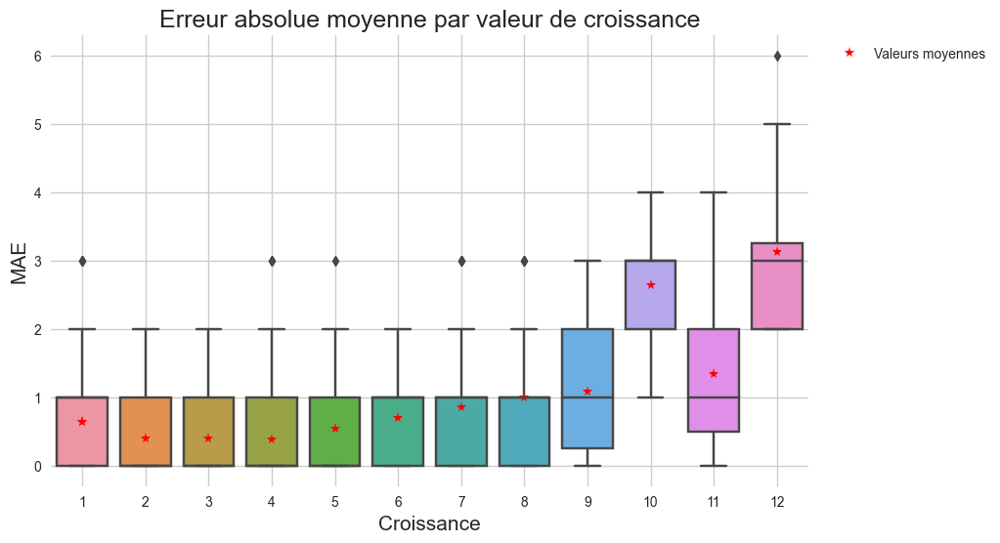

In [61]:
plot_growth_mae_box(true_labels_us, pred_labels_us)

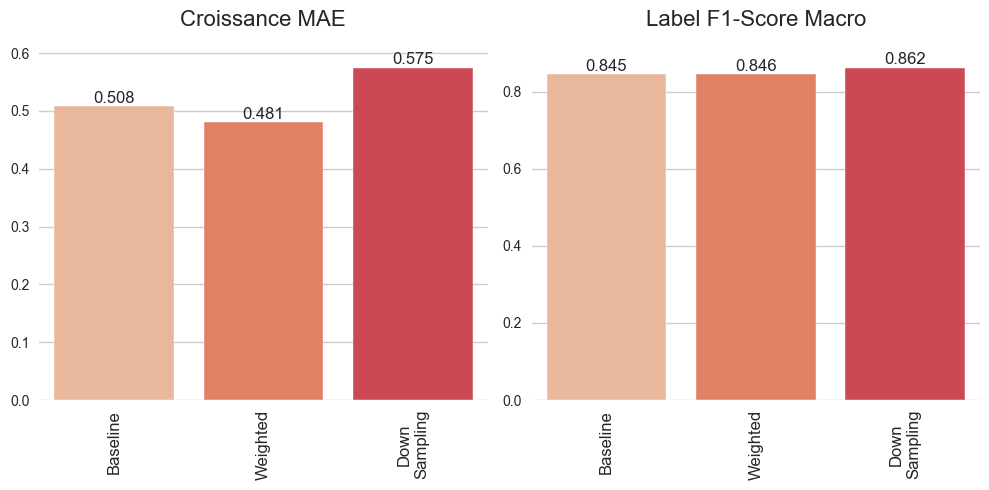

In [62]:
plot_comparison(dict_growth_mae, dict_label_f1_score)

## <font color="#114b98" id="section_7">7. Implémentation de DenseWeight & LMFLoss</font>

In [63]:
'''
DenseWeight et DenseLoss sont deux méthodes complémentaires utilisées
pour gérer les problèmes de régression déséquilibrés lors de l'entraînement
d'un modèle d'apprentissage automatique.

DenseWeight est une méthode qui attribue des poids à chaque échantillon
de l'ensemble de données d'entraînement en fonction de la rareté de leurs 
valeurs cibles. Cela est conçu pour aider le modèle à prêter davantage 
attention aux cas rares, qui sont généralement plus difficiles à prédire. 
Le paramètre alpha contrôle l'intensité du schéma de pondération basé sur 
la densité, où alpha = 0.0 signifie une pondération uniforme, et des valeurs
d'alpha plus grandes mettent davantage l'accent sur les échantillons rares. 
La rareté d'une valeur cible est jugée sur la base de sa densité, obtenue 
grâce à l'estimation de densité par noyau (KDE).

DenseLoss est une fonction de perte personnalisée utilisée pendant l'entraînement 
du modèle. La fonction de perte est ce que le modèle optimise. Elle informe 
le modèle de la qualité de ses performances. Dans ce cas, la fonction DenseLoss 
est une erreur absolue moyenne pondérée (MAE) qui utilise les poids calculés 
par la méthode DenseWeight.

L'utilisation de DenseWeight et DenseLoss ensemble est logique car elles sont 
conçues pour travailler ensemble. DenseWeight ajuste l'importance de chaque 
échantillon dans l'ensemble de données d'entraînement en fonction de la rareté 
de leurs valeurs cibles, tandis que DenseLoss veille à ce que ces poids soient 
pris en compte lorsque le modèle apprend de ses erreurs.
'''

# Extraction de la variable cible
y = train_df['growth'] 

# Calcul des poids des classes en utilisant DenseWeight
dw = DenseWeight(alpha=0.25) # J'ai testé plusieurs fois en faisant varier ce paramètre entre 0.1 et 2.0
train_weights_growth = dw.fit(np.ravel(y))

def multi_output_gen(df, datagen, image_size, batch_size):
    gen = datagen.flow_from_dataframe(
        train_df,
        x_col='new_file_path',
        y_col=['label_encoded', 'growth'],
        target_size=image_size,
        batch_size=batch_size,
        class_mode='multi_output',
        color_mode="rgb",
        shuffle=True,
        seed=42,
    )

    while True:
        gnext = gen.next()
        yield gnext[0], {
            'growth': gnext[1][1],  
            'label': gnext[1][0] 
        }, {
            'growth': None, 
            'label': train_weights_growth
        }


train_generator_imba = multi_output_gen(train_df, train_datagen, image_size, batch_size)

    
class DenseLoss(losses.Loss):
    def __init__(self, alpha, **kwargs):
        super().__init__(**kwargs)
        self.alpha = alpha
        self.dw = DenseWeight(alpha=self.alpha)

    def get_config(self):
        base_config = super().get_config()
        return {**base_config, "alpha": self.alpha}
    
    def call(self, y_true, y_pred):
        y_true = tf.cast(y_true, tf.float32)
        y_pred = tf.cast(y_pred, tf.float32)

        # Compute weights
        weights = self.dw.fit(np.ravel(y_true.numpy()))

        # Calculate mean absolute error
        mae = K.mean(weights * K.abs(y_true - y_pred), axis=-1)

        return mae

In [64]:
'''
LMFLoss est une fonction de perte personnalisée qui combine les 
avantages de la perte Focale et de la perte LDAM pour traiter le 
problème du déséquilibre des classes dans les tâches de classification.

Les classes majoritaires sont pénalisées en augmentant leur marge 
dans la perte LDAM, rendant leur classification plus difficile pour 
le modèle. En parallèle, la perte Focal augmente l'attention portée 
aux classes minoritaires en réduisant le poids des exemples facilement 
classifiables.

La marge pour chaque classe est contrôlée par la liste "ldam_margin_list",
qui est calculée à partir de la distribution des classes. Les classes 
majoritaires se voient attribuer une marge plus importante pour encourager 
le modèle à se concentrer davantage sur les classes minoritaires.

Les paramètres alpha et gamma contrôlent respectivement la pondération des 
classes dans le calcul de cette pertev et le poids de la perte focale. 
'''

class LMFLoss(losses.Loss):
    def __init__(self, cls_num_list, gamma=1.5, alpha=0.5, beta=0.5, margin_constant=1.0, reduction=tf.keras.losses.Reduction.AUTO, **kwargs):
        super(LMFLoss, self).__init__(reduction=reduction, **kwargs)

        self.cls_num_list = cls_num_list
        self.gamma = gamma
        self.alpha = alpha
        self.beta = beta
        self.margin_constant = margin_constant

        # Calcul des valeurs des marges LDAM
        ldam_margin_list = [margin_constant / (c / sum(cls_num_list)) ** 0.25 for c in cls_num_list]
        self.ldam_margin_list = tf.convert_to_tensor(ldam_margin_list, dtype=tf.float32)

    def get_config(self):
        config = super(LMFLoss, self).get_config()
        config.update({
            'cls_num_list': self.cls_num_list,
            'gamma': self.gamma,
            'alpha': self.alpha,
            'beta': self.beta,
        })
        return config

    def call(self, y_true, y_pred):
        y_true = tf.cast(y_true, tf.int32)
        y_pred = tf.cast(y_pred, tf.float32)

        # Calcul de la Focal loss
        focal_loss = -self.alpha * tf.pow(1. - y_pred, self.gamma) * tf.math.log(y_pred)
        focal_loss = tf.reduce_sum(focal_loss, axis=-1)

        # Calcul de la LDAM loss
        y_true_one_hot = tf.one_hot(y_true, depth=len(self.cls_num_list))
        y_true_one_hot_squeezed = tf.squeeze(y_true_one_hot, axis=1)
        mask = tf.cast(y_true_one_hot_squeezed, dtype=bool)
        y_pred_margins = tf.where(mask, y_pred - self.ldam_margin_list, y_pred)
        ldma_loss = tf.nn.softmax_cross_entropy_with_logits(labels=y_true_one_hot, logits=y_pred_margins)

        # Combinaison de Focal loss et LDAM loss
        loss = self.alpha * ldma_loss + self.beta * focal_loss

        return tf.reduce_mean(loss)


# Extraction des étiquettes de classe uniques à partir de la colonne 'label_encoded' dans le DataFrame train_df
unique_classes_train = train_df['label_encoded'].unique()

# Tri des étiquettes de classe uniques
unique_classes_train_sorted = np.sort(unique_classes_train)

# Calcul des fréquences de classe en fonction des étiquettes de classe uniques triées
cls_num_list = train_df['label_encoded'].value_counts().loc[unique_classes_train_sorted].values

In [65]:
# Définition de la fonction de création de modèle pour Keras Tuner
def build_model(hp):
    
    # Définition de la couche d'entrée
    input_layer = Input(input_shape)
    
    # Chargement du modèle pré-entraîné
    base_model = MobileNetV3Small(
        weights='imagenet',
        include_top=False,
        input_tensor=input_layer,
        minimalistic = True
    )
    
    # Dégel de toutes les couches du modèle
    for layer in base_model.layers:
        layer.trainable = True
             
    # Ajout des nouvelles couches
    x = GlobalAveragePooling2D()(base_model.output)
    x = Flatten()(x)

    dense_size = 256
    dropout_rate = 0.2

    x_label = Dense(dense_size, activation='relu', kernel_initializer='he_normal')(x)
    x_label = Dropout(dropout_rate)(x_label)
    label_output = Dense(num_classes, activation='softmax', name='label')(x_label)
    
    x_growth = Dense(dense_size, activation='relu', kernel_initializer='he_normal')(x)
    x_growth = Dropout(dropout_rate)(x_growth)
    growth_output = Dense(1, activation='relu', name='growth')(x_growth)
   
    # Combinaison du modèle de base et des nouvelles couches de classification
    model = Model(inputs=input_layer, 
                  outputs=[label_output, growth_output],
                  name="model_mn_imba")

    alpha_growth = hp.Choice('alpha_growth', [0.1, 0.25, 0.5, 1.0, 1.25, 1.5, 2.0])
    alpha_label = hp.Choice('alpha_label', [0.1, 0.25, 0.50, 1.0, 1.25, 2.0, 2.5, 3.0])
    beta = hp.Choice('beta', [0.01, 0.05, 0.1, 0.25, 0.5])    
    gamma = hp.Choice('gamma', [1.0, 1.5, 2.5, 4.0, 5.0])    
    margin_constant = 1.0 
    
    lmf_loss = LMFLoss(cls_num_list, gamma=gamma, alpha=alpha_label, beta=beta, margin_constant=margin_constant)
    
    # Compilation du modèle
    model.compile(
        optimizer=Adam(learning_rate=0.0001, clipnorm=1.0),
        loss={
            'label': lmf_loss,
            'growth': DenseLoss(alpha=alpha_growth)   
        },
        metrics={
            'label': f1_macro,
            'growth': 'mae'
        },
    )

    return model   


EPOCHS = 20
MAX_TRIALS = 30

# Utilisation de BayesianOptimization
tuner_imba = BayesianOptimization(
    build_model,
    objective=[label_f1_objective, growth_mae_objective],
    max_trials=MAX_TRIALS,
    num_initial_points=5,
    directory="keras_tuner_v4",
    project_name="tuner_hp_mn_imba",
    overwrite=True
)

steps_per_epoch = len(train_df) // batch_size

# tuner_imba.search(train_generator_imba,
#                   steps_per_epoch=steps_per_epoch,
#                   epochs=EPOCHS,
#                   validation_data=val_generator,
#                   callbacks=[build_callbacks()])

In [66]:
# # Impression des meilleurs hyperparamètres
# print("Best hyperparameters:", tuner_imba.get_best_hyperparameters()[0].values)

In [67]:
# Best hyperparameters: 'alpha_growth': 0.25, 'alpha_label': 2.5, 'beta': 0.05, 'gamma': 4.0

In [68]:
# # Sauvegarde des meilleurs hyperparamètres
# best_hps_ = tuner_imba.get_best_hyperparameters(num_trials=1)[0]
# with open(path + "best_hp_mn_imba.pkl", "wb") as f:
#     pickle.dump(best_hps_, f)
    
# # Récupération du meilleur modèle
# model_mn_imba = tuner_imba.get_best_models(num_models=1)[0]

# # Sauvegarde du modèle
# model_mn_imba.save(path + 'model_mn_imba2.h5') 

In [69]:
# Définition d'un dictionnaire contenant les objets personnalisés
custom_objects_1 = {'LMFLoss': LMFLoss(cls_num_list, gamma=4.0, alpha=2.5, beta=0.05, margin_constant=1.0),
                    'f1_macro': f1_macro,
                    'DenseLoss': DenseLoss(0.25)}

# Impression des hyperparamètres
print("LMFLoss hyperparameters: ", custom_objects_1['LMFLoss'].get_config())
print("DenseLoss hyperparameters: ", custom_objects_1['DenseLoss'].get_config())

# Chargement du modèle avec les objets personnalisés
model_mn_imba = load_model(path + 'model_mn_imba2.h5', custom_objects=custom_objects_1)

LMFLoss hyperparameters:  {'reduction': 'auto', 'name': None, 'cls_num_list': array([ 330, 2992, 2367, 2480,  323], dtype=int64), 'gamma': 4.0, 'alpha': 2.5, 'beta': 0.05}
DenseLoss hyperparameters:  {'reduction': 'auto', 'name': None, 'alpha': 0.25}


1/1 [==============================] - 0s 61ms/step


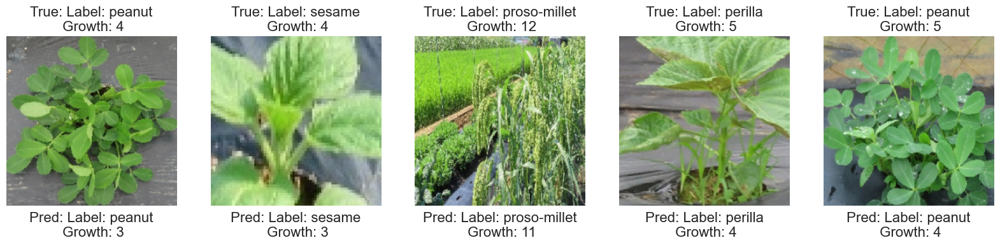

In [92]:
plot_true_pred_labels(model_mn_imba, test_generator)

In [71]:
true_labels_imba, pred_labels_imba, true_images_imba = get_true_and_pred_labels(test_generator, model_mn_imba)

In [72]:
# Calcul du F1-score macro
f1_ = f1_score(true_labels_imba[0], pred_labels_imba[0], average='macro')
dict_label_f1_score['DenseWeight\n+ LMFLoss'] = f1_
print(f"F1-Score Macro: {f1_:.3f}")
print("\nClassification report for labels :")
print(classification_report(true_labels_imba[0], pred_labels_imba[0]))

F1-Score Macro: 0.883

Classification report for labels :
              precision    recall  f1-score   support

           0       0.84      0.66      0.74        89
           1       0.96      0.98      0.97       610
           2       0.95      0.95      0.95       531
           3       0.92      0.97      0.94       484
           4       0.96      0.70      0.81        74

    accuracy                           0.94      1788
   macro avg       0.93      0.85      0.88      1788
weighted avg       0.94      0.94      0.94      1788



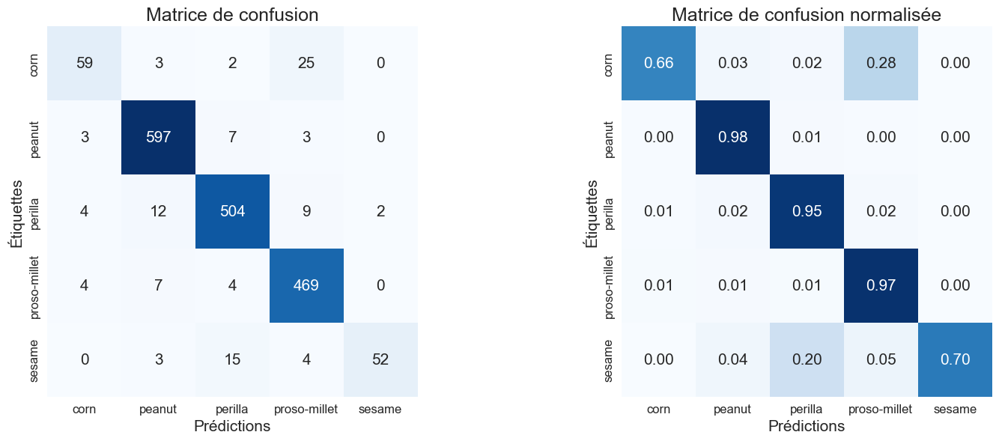

In [73]:
plot_confusion_matrix(true_labels_imba, pred_labels_imba)

In [74]:
mae = mean_absolute_error(true_labels_imba[1], pred_labels_imba[1])
dict_growth_mae['DenseWeight\n+ LMFLoss'] = mae
print(f"Croissance MAE : {mae:.3f}")

Croissance MAE : 0.449


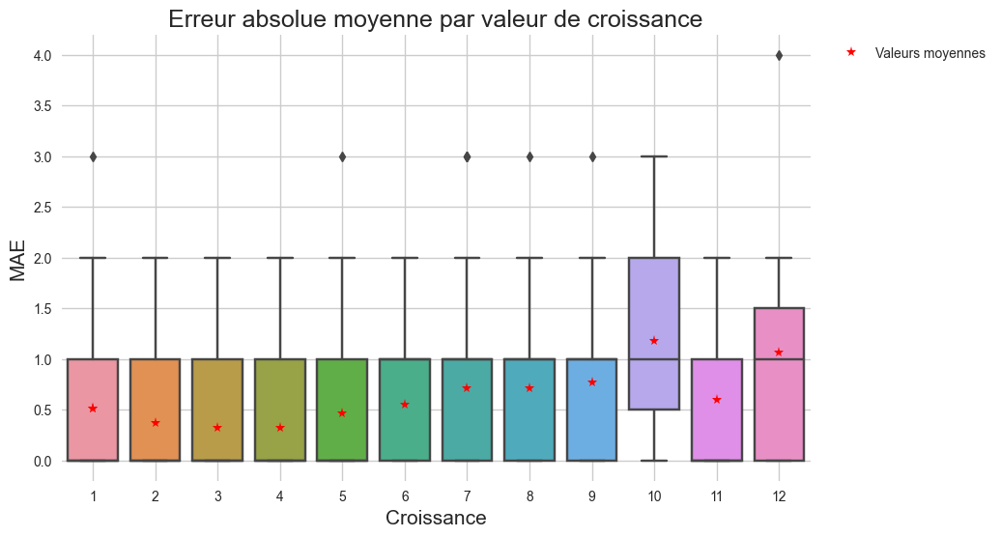

In [75]:
plot_growth_mae_box(true_labels_imba, pred_labels_imba)

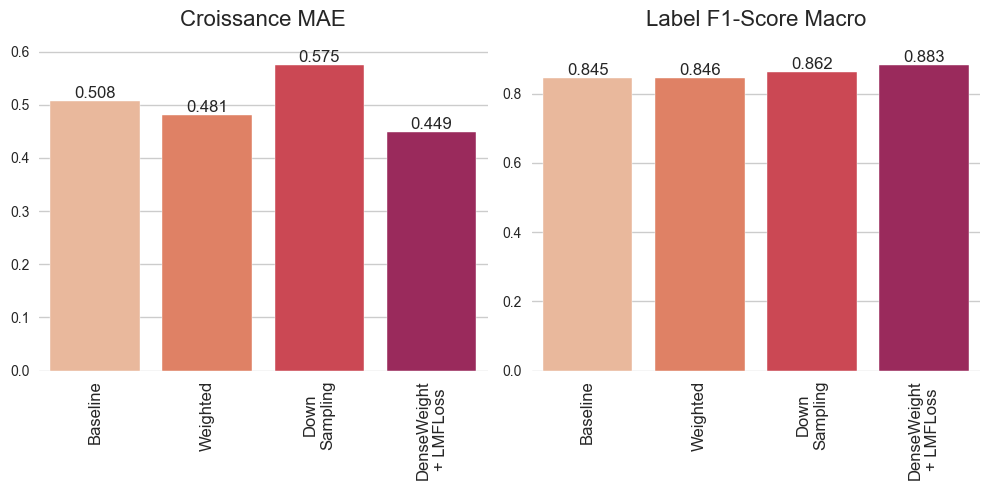

In [76]:
plot_comparison(dict_growth_mae, dict_label_f1_score)

## <font color="#114b98" id="section_8">8. Comparaison des performances</font>

### <font color="#114b98"> a) Performances sur la prédiction du label</font>

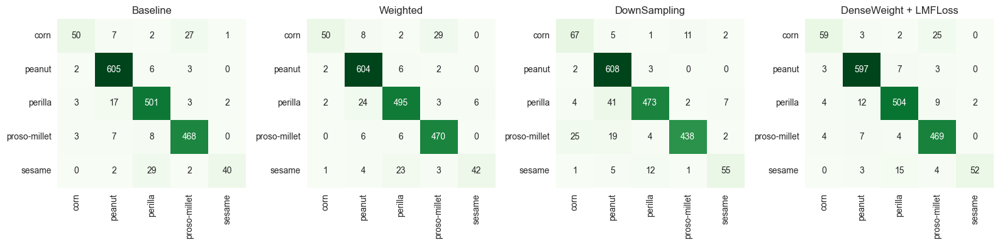

In [77]:
cnf_matrix_mn = confusion_matrix(true_labels[0], pred_labels[0])
cnf_matrix_mn_w = confusion_matrix(true_labels_w[0], pred_labels_w[0])
cnf_matrix_mn_us = confusion_matrix(true_labels_us[0], pred_labels_us[0])
cnf_matrix_mn_imba = confusion_matrix(true_labels_imba[0], pred_labels_imba[0])

# Création du sous-tracé avec 1 ligne et 4 colonnes
fig, axes = plt.subplots(1, 4, figsize=(16, 4))

# Paramètres pour l'annotation de la matrice
heatmap_args = {"annot": True, "fmt": "d", "cmap": 'Greens', "cbar": False}

# Plot de la première matrice de confusion
sns.heatmap(cnf_matrix_mn, **heatmap_args, ax=axes[0])
axes[0].set_title('Baseline')
axes[0].set_xticklabels(label_str.values(), rotation=90)
axes[0].set_yticklabels(label_str.values(), rotation=0)

# Plot de la deuxième matrice de confusion
sns.heatmap(cnf_matrix_mn_w, **heatmap_args, ax=axes[1])
axes[1].set_title('Weighted')
axes[1].set_xticklabels(label_str.values(), rotation=90)
axes[1].set_yticklabels(label_str.values(), rotation=0)

# Plot de la troisième matrice de confusion
sns.heatmap(cnf_matrix_mn_us, **heatmap_args, ax=axes[2])
axes[2].set_title('DownSampling')
axes[2].set_xticklabels(label_str.values(), rotation=90)
axes[2].set_yticklabels(label_str.values(), rotation=0)

# Plot de la quatrième matrice de confusion
sns.heatmap(cnf_matrix_mn_imba, **heatmap_args, ax=axes[3])
axes[3].set_title('DenseWeight + LMFLoss')
axes[3].set_xticklabels(label_str.values(), rotation=90)
axes[3].set_yticklabels(label_str.values(), rotation=0)

plt.tight_layout()
plt.show()

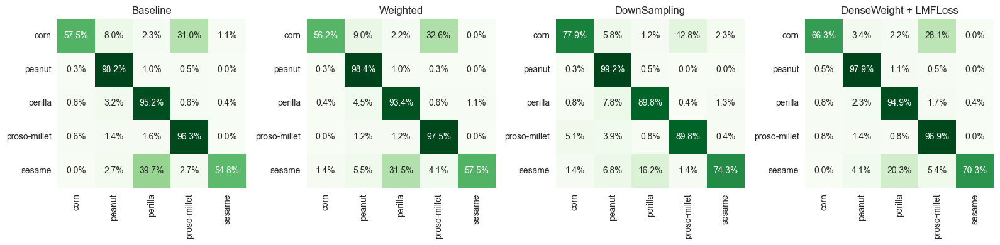

In [78]:
# Calcul des matrices normalisées par ligne
cnf_matrix_mn_normalized = cnf_matrix_mn.astype('float') / cnf_matrix_mn.sum(axis=1)[:, np.newaxis]
cnf_matrix_mn_w_normalized = cnf_matrix_mn_w.astype('float') / cnf_matrix_mn_w.sum(axis=1)[:, np.newaxis]
cnf_matrix_mn_us_normalized = cnf_matrix_mn_us.astype('float') / cnf_matrix_mn_us.sum(axis=1)[:, np.newaxis]
cnf_matrix_mn_imba_normalized = cnf_matrix_mn_imba.astype('float') / cnf_matrix_mn_imba.sum(axis=1)[:, np.newaxis]

# Création du sous-tracé avec 1 ligne et 4 colonnes
fig, axes = plt.subplots(1, 4, figsize=(16, 4))

# Paramètres pour l'annotation de la matrice
heatmap_args = {"annot": True, "fmt": ".1%", "cmap": 'Greens', "cbar": False}

# Plot de la première matrice de confusion normalisée par ligne
sns.heatmap(cnf_matrix_mn_normalized, **heatmap_args, ax=axes[0])
axes[0].set_title('Baseline')
axes[0].set_xticklabels(label_str.values(), rotation=90)
axes[0].set_yticklabels(label_str.values(), rotation=0)

# Plot de la deuxième matrice de confusion normalisée par ligne
sns.heatmap(cnf_matrix_mn_w_normalized, **heatmap_args, ax=axes[1])
axes[1].set_title('Weighted')
axes[1].set_xticklabels(label_str.values(), rotation=90)
axes[1].set_yticklabels(label_str.values(), rotation=0)

# Plot de la troisième matrice de confusion normalisée par ligne
sns.heatmap(cnf_matrix_mn_us_normalized, **heatmap_args, ax=axes[2])
axes[2].set_title('DownSampling')
axes[2].set_xticklabels(label_str.values(), rotation=90)
axes[2].set_yticklabels(label_str.values(), rotation=0)

# Plot de la quatrième matrice de confusion normalisée par ligne
sns.heatmap(cnf_matrix_mn_imba_normalized, **heatmap_args, ax=axes[3])
axes[3].set_title('DenseWeight + LMFLoss')
axes[3].set_xticklabels(label_str.values(), rotation=90)
axes[3].set_yticklabels(label_str.values(), rotation=0)

plt.tight_layout()
plt.show()

In [79]:
true_labels_list = [true_labels, true_labels_w, true_labels_us, true_labels_imba]
pred_labels_list = [pred_labels, pred_labels_w, pred_labels_us, pred_labels_imba]
models = ['Baseline', 'Weighted', 'DownSamp.', 'DW+LMFLoss']

# Liste des espèces
species = ['corn', 'peanut', 'perilla', 'proso-millet', 'sesame']

# Calcul du F1-score par modèle pour chaque espèce
f1_scores = []

for i in range(len(species)):
    f1_scores_species = []
    for j in range(len(models)):
        true_labels_species = [int(true_labels_list[j][0][k] == i) for k in range(len(true_labels_list[j][0]))]
        pred_labels_species = [int(pred_labels_list[j][0][k] == i) for k in range(len(pred_labels_list[j][0]))]
        f1_score_species = f1_score(true_labels_species, pred_labels_species, average='macro')
        f1_scores_species.append(f1_score_species)
    f1_scores.append(f1_scores_species)

# Affichage des F1-scores par modèle pour chaque espèce
for i in range(len(species)):
    print(f"Species: {species[i]}")
    for j in range(len(models)):
        print(f"{models[j]}: {f1_scores[i][j]}")
    print()

Species: corn
Baseline: 0.8382697313540839
Weighted: 0.8408119658119658
DownSamp.: 0.8546422565296055
DW+LMFLoss: 0.8650697676986875

Species: peanut
Baseline: 0.9729815494809375
Weighted: 0.9681388272061846
DownSamp.: 0.954541371250553
DW+LMFLoss: 0.9764721200301405

Species: perilla
Baseline: 0.9533731104859091
Weighted: 0.9517818858460418
DownSamp.: 0.9492497468470957
DW+LMFLoss: 0.9631867253592701

Species: proso-millet
Baseline: 0.9629617325172961
Weighted: 0.9657570734593868
DownSamp.: 0.9538178413456881
DW+LMFLoss: 0.9609866791765309

Species: sesame
Baseline: 0.8396252740681682
Weighted: 0.8417528794058198
DownSamp.: 0.8884916015300184
DW+LMFLoss: 0.9027697215777262



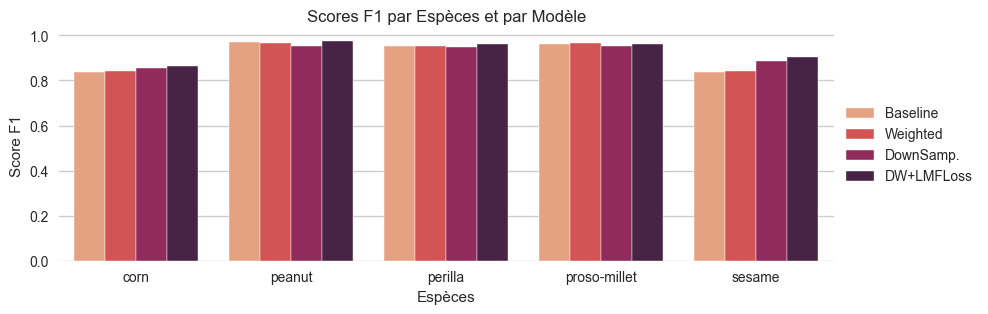

In [95]:
# Création d'un DataFrame à partir des scores
df = pd.DataFrame(f1_scores, columns=models, index=species).reset_index().melt(id_vars='index')
df.columns = ['Espèces', 'Modèle', 'Score F1']

plt.figure(figsize=(10, 3))
sns.barplot(x='Espèces', y='Score F1', hue='Modèle', data=df, palette='rocket_r')
plt.title('Scores F1 par Espèces et par Modèle')
plt.ylabel('Score F1')
plt.xlabel('Espèces')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

In [81]:
def decode_labels_graph(encoded_label, growth):
    label_ = label_str[encoded_label]
    growth_ = int(growth)
    return f"Label: {label_}\n Growth: {growth_}"

def plot_true_pred_labels_sesame(true_labels_imba, pred_labels_imba, true_images_imba, label):
    fig, axes = plt.subplots(1, 5, figsize=(20, 8))
    
    counter = 0
    
    for i in range(1000):
        if counter == 5:
            break
            
        true_label, true_growth = true_labels_imba[0][i], true_labels_imba[1][i]
        true_title = decode_labels_graph(true_label, true_growth)

        pred_label, pred_growth = pred_labels_imba[0][i], pred_labels_imba[1][i]
        pred_title = decode_labels_graph(pred_label, pred_growth)

        if true_label == label and int(pred_label) != label:
            resized_image = cv2.resize((true_images_imba[i]).astype('uint8'), (200, 200), interpolation=cv2.INTER_AREA)
            axes[counter].imshow(resized_image)
            axes[counter].set_title(f'True: {true_title}', fontsize=16)
            axes[counter].axis('off')
            axes[counter].text(0.5, -0.18, f'Pred: {pred_title}', size=16, ha="center", 
                               transform=axes[counter].transAxes, color='red')
            counter += 1
    plt.show()

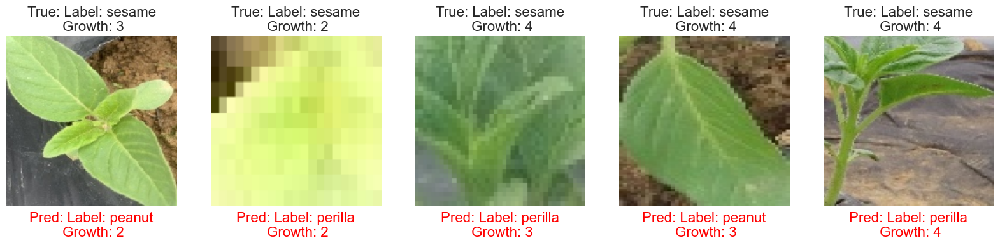

In [101]:
plot_true_pred_labels_sesame(true_labels_imba, pred_labels_imba, true_images_imba, 4)

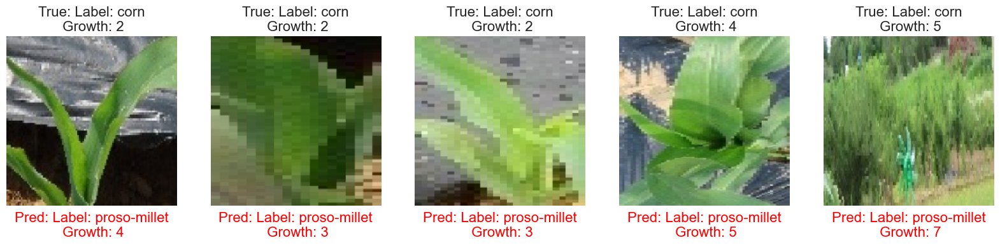

In [102]:
plot_true_pred_labels_sesame(true_labels_imba, pred_labels_imba, true_images_imba, 0)

### <font color="#114b98"> b) Performances sur la prédiction de la croissance</font>

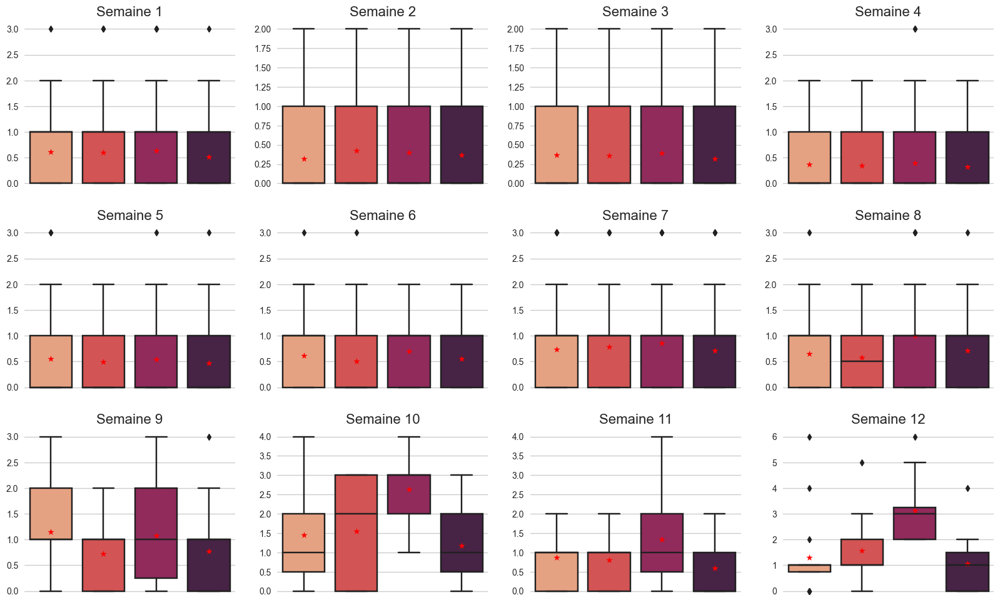

In [106]:
fig, axes = plt.subplots(3, 4, figsize=(20, 12))

for i in range(3):
    row = i
    for j, model in enumerate(models):
        col = j
        growth_errors = []
        for k, model in enumerate(models):
            true_labels_ = true_labels_list[k][1]
            pred_labels_ = pred_labels_list[k][1]
            growth_errors.append(np.abs(true_labels_[true_labels_ == (row * 4) + col + 1] - pred_labels_[true_labels_ == (row * 4) + col + 1]))
        
        sns.boxplot(data=growth_errors, showfliers=True, ax=axes[row, col], palette='rocket_r')
        mean_maes = [np.mean(errors) for errors in growth_errors]
        axes[row, col].scatter(range(len(models)), mean_maes, marker='*', color='red')
        axes[row, col].set_xticks([])
        axes[row, col].set_xticklabels([])

        axes[row, col].set_title(f'Semaine {(row * 4) + col + 1}', fontsize=16)
        axes[row, col].grid(True)

plt.show()

In [85]:
def plot_high_low_error_images(true_labels, pred_labels, true_images):
    same_labels = []
    same_growths = []
    growth_errors = np.abs(true_labels[1] - pred_labels[1])

    # Obtenir les indices des 5 images avec les plus grandes erreurs de croissance
    high_error_indices = np.argsort(growth_errors)[-5:]

    fig, axes = plt.subplots(2, 5, figsize=(20, 10))

    # Afficher les images avec les plus grandes erreurs de croissance
    for i, idx in enumerate(high_error_indices):
        true_label, true_growth = true_labels[0][idx], true_labels[1][idx]
        true_title = decode_labels_graph(true_label, true_growth)
        same_labels.append(true_label)
        same_growths.append(true_growth)
        pred_label, pred_growth = pred_labels[0][idx], pred_labels[1][idx]
        pred_title = decode_labels_graph(pred_label, pred_growth)
        resized_image = cv2.resize((true_images_imba[idx]).astype('uint8'), (200, 200), interpolation=cv2.INTER_AREA)
        axes[0, i].imshow(resized_image)
        axes[0, i].set_title(f'True: {true_title}', fontsize=16)
        axes[0, i].axis('off')
        axes[0, i].text(0.5, -0.18, f'Pred: {pred_title}', size=16, ha="center", 
                        transform=axes[0, i].transAxes, 
                        color='red' if true_growth != pred_growth else 'green')
    
    
    low_error_indices = np.argsort(growth_errors)

    for i in range(5): 
        for idx in low_error_indices:
            if (true_labels[0][idx] == same_labels[i]) and (true_labels[1][idx] == same_growths[i]):
                true_label, true_growth = true_labels[0][idx], true_labels[1][idx]
                true_title = decode_labels_graph(true_label, true_growth)
                
                pred_label, pred_growth = pred_labels[0][idx], pred_labels[1][idx]
                pred_title = decode_labels_graph(pred_label, pred_growth)
                
                resized_image = cv2.resize((true_images_imba[idx]).astype('uint8'), (200, 200), interpolation=cv2.INTER_AREA)
                axes[1, i].imshow(resized_image)
                axes[1, i].set_title(f'True: {true_title}', fontsize=16)
                axes[1, i].axis('off')
                axes[1, i].text(0.5, -0.18, f'Pred: {pred_title}', size=16, ha="center", 
                                 transform=axes[1, i].transAxes, 
                                 color='green')
                break
         
    plt.show()

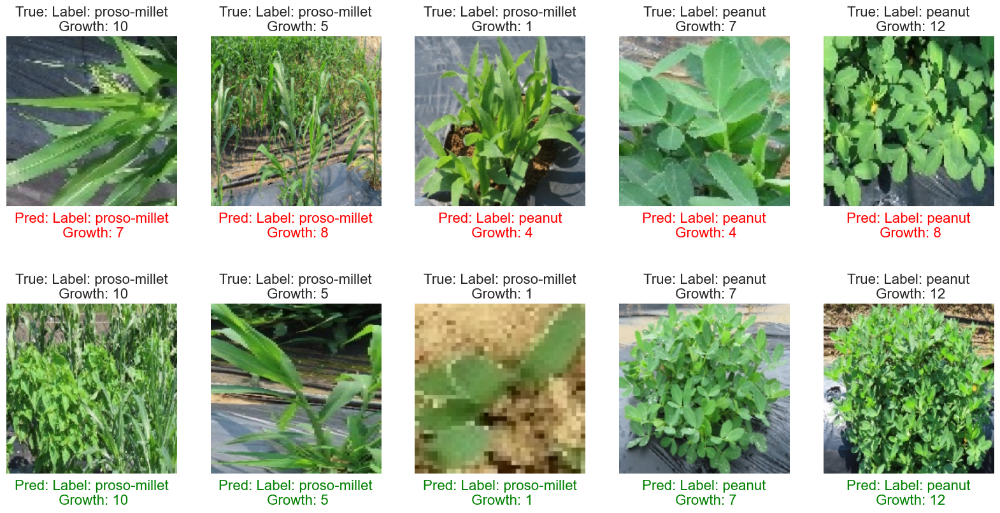

In [94]:
plot_high_low_error_images(true_labels_imba, pred_labels_imba, true_images_imba)